# COSMOS master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))
import datetime
print("This notebook was executed on: \n{}".format(datetime.datetime.now()))

This notebook was run with herschelhelp_internal version: 
0246c5d (Thu Jan 25 17:01:47 2018 +0000) [with local modifications]
This notebook was executed on: 
2018-02-15 11:49:49.744672


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3, venn2

from herschelhelp_internal.masterlist import nb_compare_mags, nb_ccplots, nb_histograms, quick_checks, find_last_ml_suffix

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = find_last_ml_suffix()
#SUFFIX = "_20170815"

master_catalogue = Table.read("{}/master_catalogue_cosmos_{}.fits".format(OUT_DIR, SUFFIX))

## 0 - Quick checks

In [4]:
quick_checks(master_catalogue).show_in_notebook()

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(476, False) will return an array of dtype('bool')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)
/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(476, 0) will return an array of dtype('int64')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)


Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,f_ap_vista_ks,False,533252,0,11718,-0.248489007354
1,merr_ap_vista_ks,False,533252,0,11718,-131013.984375
2,ferr_vista_ks,False,660878,14,0,-inf
3,m_vista_ks,False,660878,0,148747,-99.9000015259
4,merr_vista_ks,False,660878,14,148747,-99.9000015259
5,f_ap_vista_y,False,540328,0,4450,-0.0717538967729
6,merr_ap_vista_y,False,540328,0,4450,-8020.80322266
7,ferr_vista_y,False,677876,3,0,-inf
8,m_vista_y,False,677876,0,148747,-99.9000015259
9,merr_vista_y,False,677876,3,148747,-99.9000015259


## I - Summary of wavelength domains

In [5]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

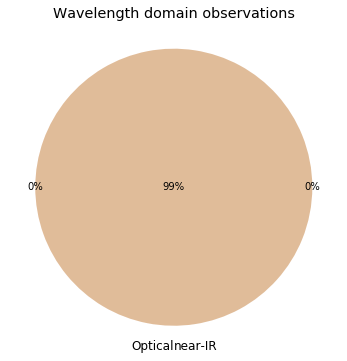

In [6]:
venn3(
    [
        np.sum(flag_obs == 4),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 6),
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 5),
        np.sum(flag_obs == 3),
        np.sum(flag_obs == 7)
    ],
    set_labels=( 'mid-IR', 'near-IR','Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

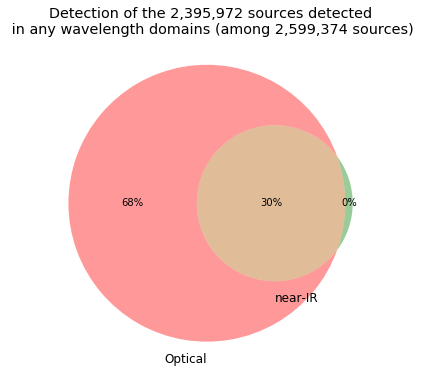

In [7]:
venn3(
    [
        np.sum(flag_det[flag_obs == 7] == 4),
        np.sum(flag_det[flag_obs == 7] == 2),
        np.sum(flag_det[flag_obs == 7] == 6),
        np.sum(flag_det[flag_obs == 7] == 1),
        np.sum(flag_det[flag_obs == 7] == 5),
        np.sum(flag_det[flag_obs == 7] == 3),
        np.sum(flag_det[flag_obs == 7] == 7)
    ],
    set_labels=('mid-IR', 'near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [8]:
u_bands = ["Megacam u",            "OMEGACam u"]
g_bands = ["Megacam g", "DECam g", "OMEGACam g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "OMEGACam r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i",            "OMEGACam i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z",               "SUPRIME z", "GPC1 z"]
y_bands = [                                      "SUPRIME y", "GPC1 y", "UKIDSS Y"]
j_bands = ["VISTA J",  "WIRCam J",  "UKIDSS J"  ]
h_bands = ["VISTA H",  "WIRCam H",  "UKIDSS H"  ]
k_bands = ["VISTA Ks", "WIRCam Ks", "UKIDSS K"  ]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

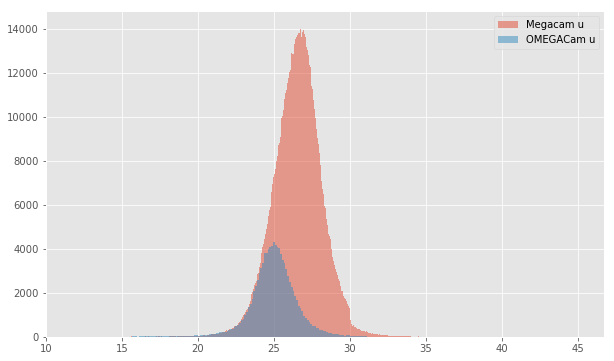

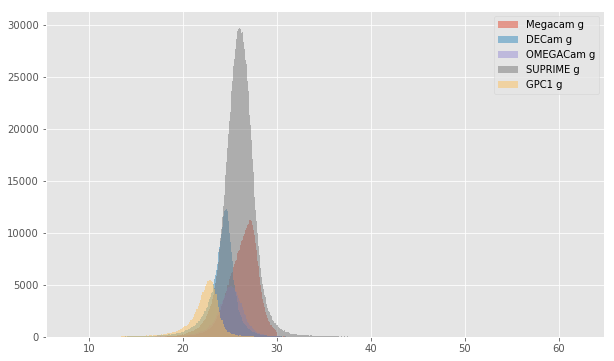

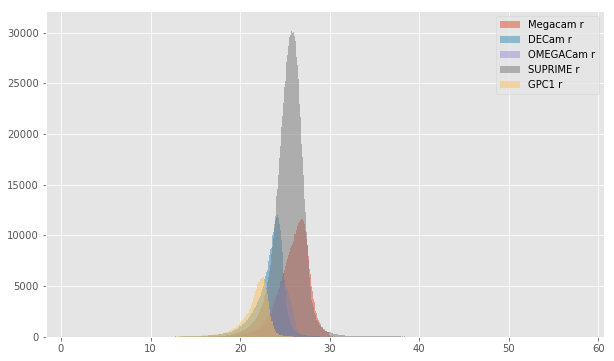

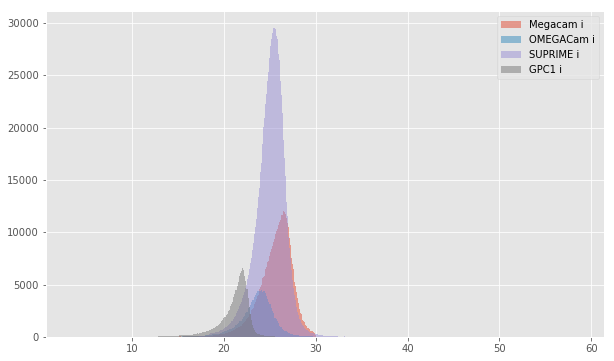

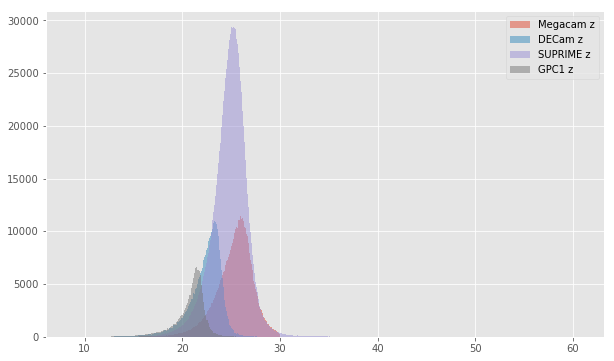

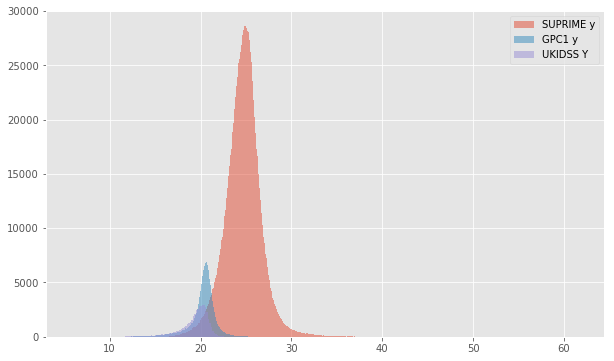

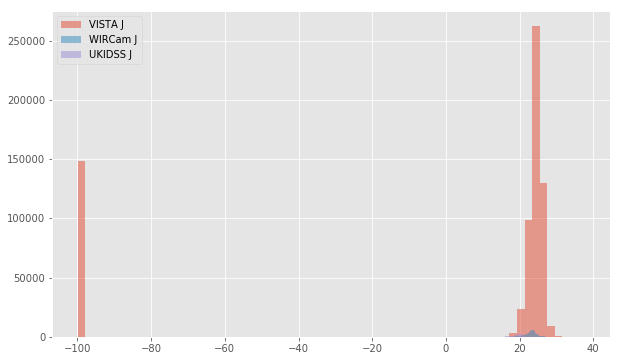

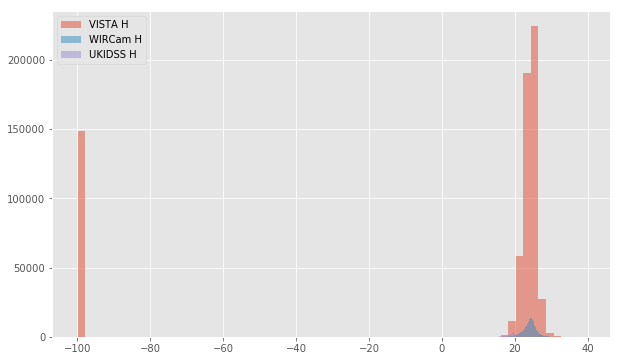

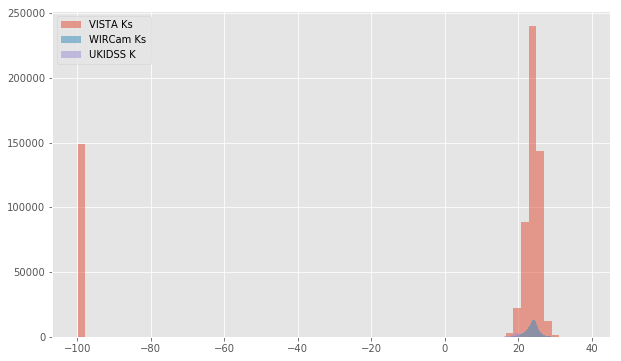

In [9]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

OMEGACam u (aperture) - Megacam u (aperture):
- Median: -0.06
- Median Absolute Deviation: 0.38
- 1% percentile: -2.5484440612792967
- 99% percentile: 2.4943000793457046


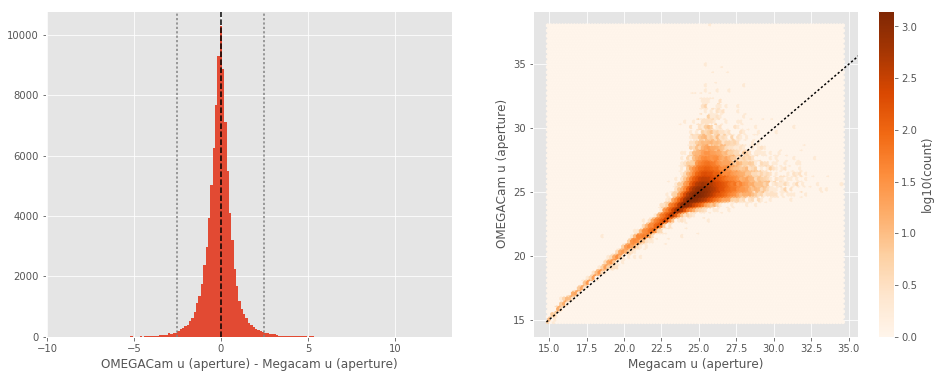

OMEGACam u (total) - Megacam u (total):
- Median: 0.31
- Median Absolute Deviation: 0.44
- 1% percentile: -2.2579750061035155
- 99% percentile: 3.58618278503418


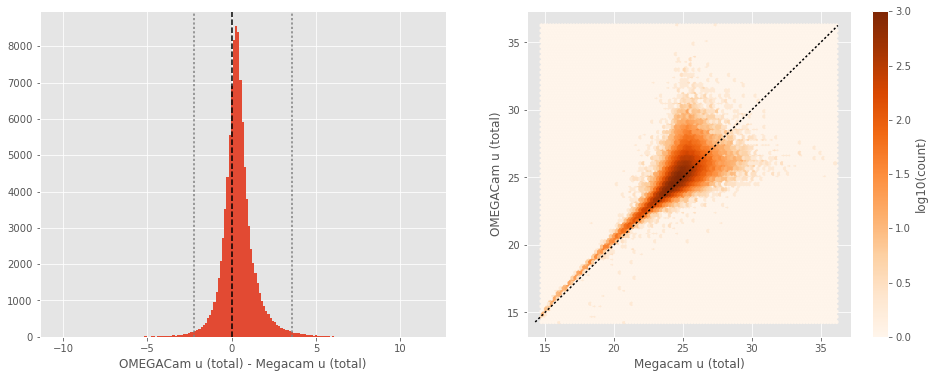

DECam g (aperture) - Megacam g (aperture):
- Median: -0.06
- Median Absolute Deviation: 0.25
- 1% percentile: -1.378798179626465
- 99% percentile: 2.7700712203979494


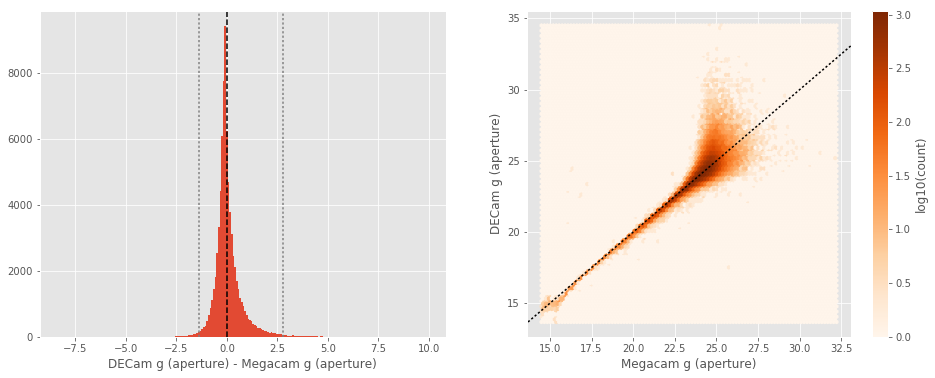

DECam g (total) - Megacam g (total):
- Median: 0.26
- Median Absolute Deviation: 0.21
- 1% percentile: -0.5860340881347655
- 99% percentile: 2.703821029663081


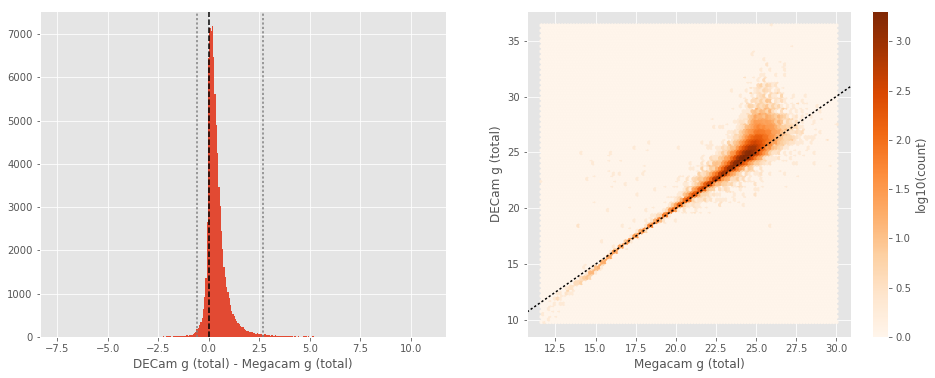

OMEGACam g (aperture) - Megacam g (aperture):
- Median: 0.19
- Median Absolute Deviation: 0.21
- 1% percentile: -0.8715366554260253
- 99% percentile: 2.0539600372314544


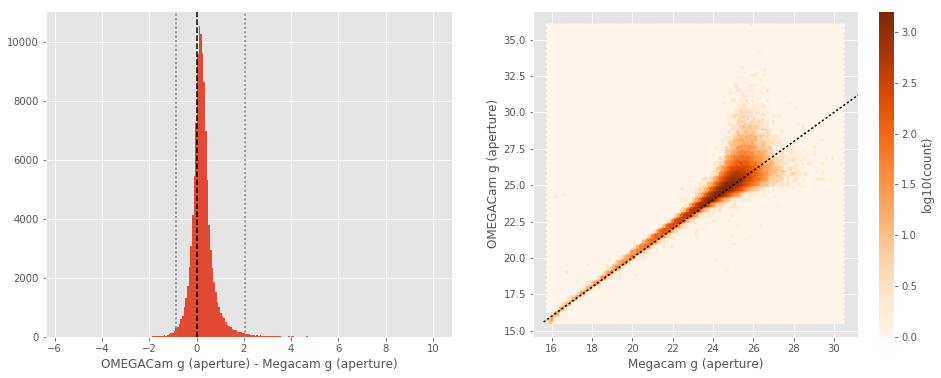

OMEGACam g (total) - Megacam g (total):
- Median: 0.49
- Median Absolute Deviation: 0.30
- 1% percentile: -0.5656244659423828
- 99% percentile: 3.228246269226068


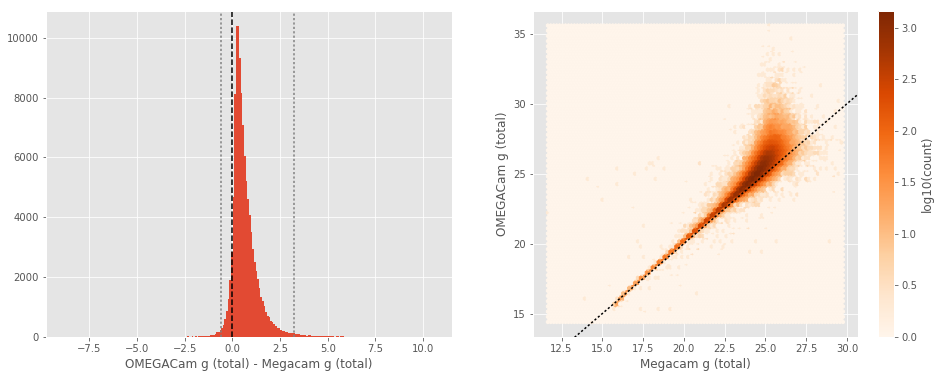

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.00
- Median Absolute Deviation: 0.18
- 1% percentile: -1.3837828254699707
- 99% percentile: 2.458099346160887


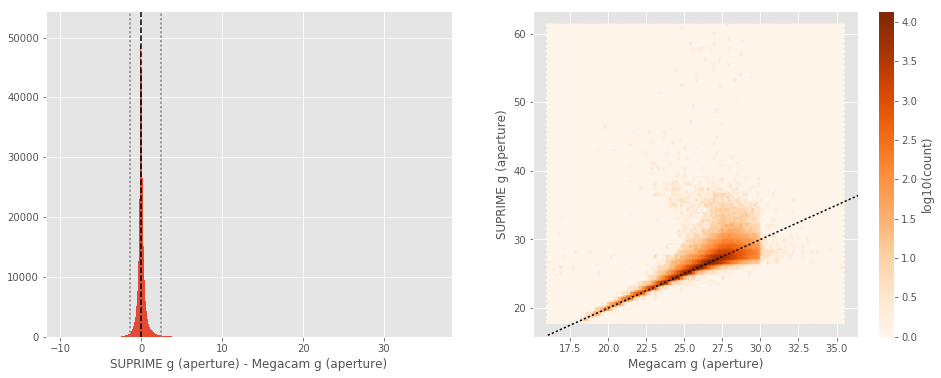

SUPRIME g (total) - Megacam g (total):
- Median: -0.00
- Median Absolute Deviation: 0.25
- 1% percentile: -2.494533824920654
- 99% percentile: 2.7505279541015635


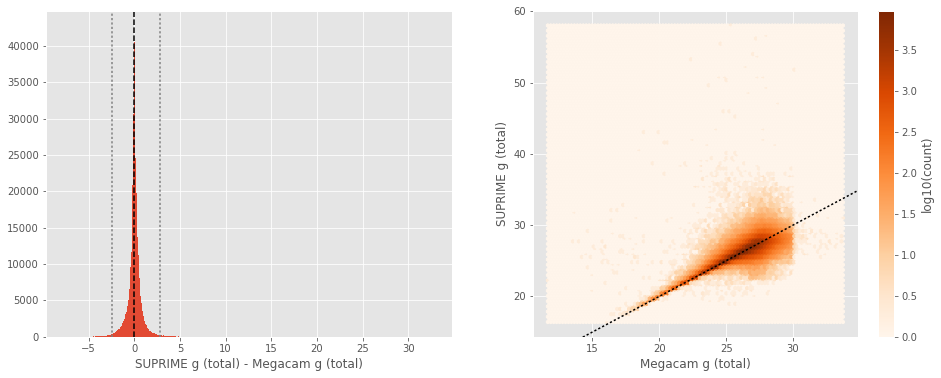

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.19
- Median Absolute Deviation: 0.34
- 1% percentile: -3.214349765777588
- 99% percentile: 2.656094722747805


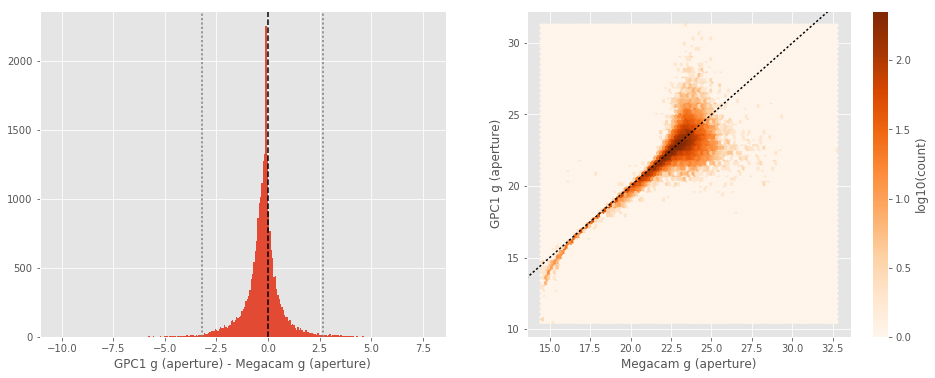

GPC1 g (total) - Megacam g (total):
- Median: 0.06
- Median Absolute Deviation: 0.29
- 1% percentile: -3.6342729187011718
- 99% percentile: 2.2842879486083993


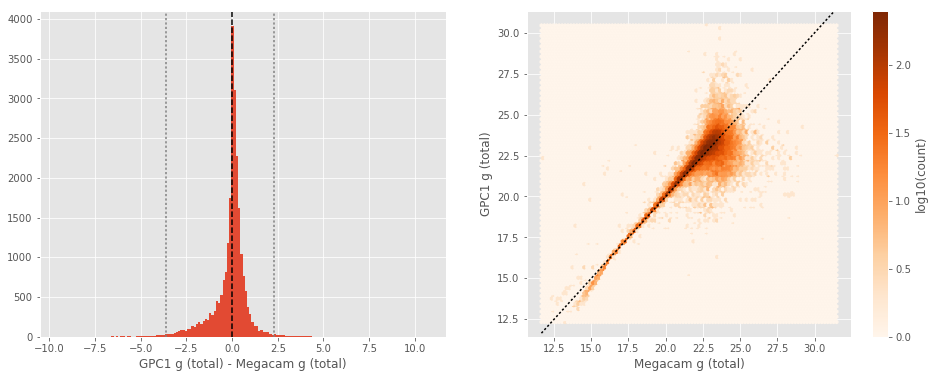

OMEGACam g (aperture) - DECam g (aperture):
- Median: 0.25
- Median Absolute Deviation: 0.30
- 1% percentile: -2.502462615966797
- 99% percentile: 1.8329804992675784


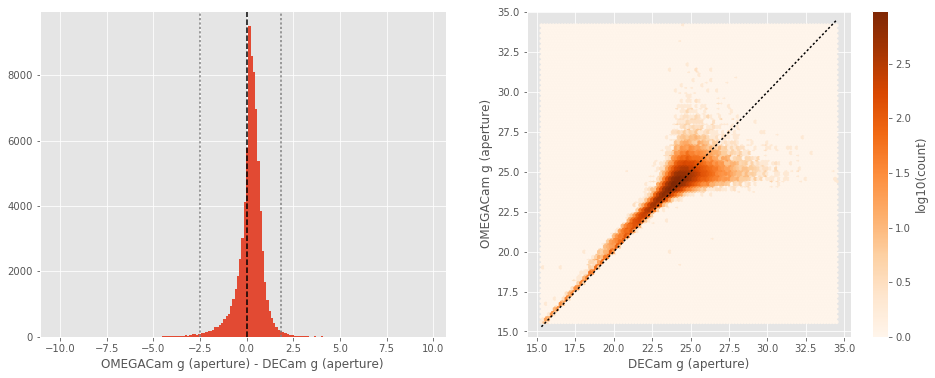

OMEGACam g (total) - DECam g (total):
- Median: 0.17
- Median Absolute Deviation: 0.25
- 1% percentile: -1.753932876586914
- 99% percentile: 2.1225991439819314


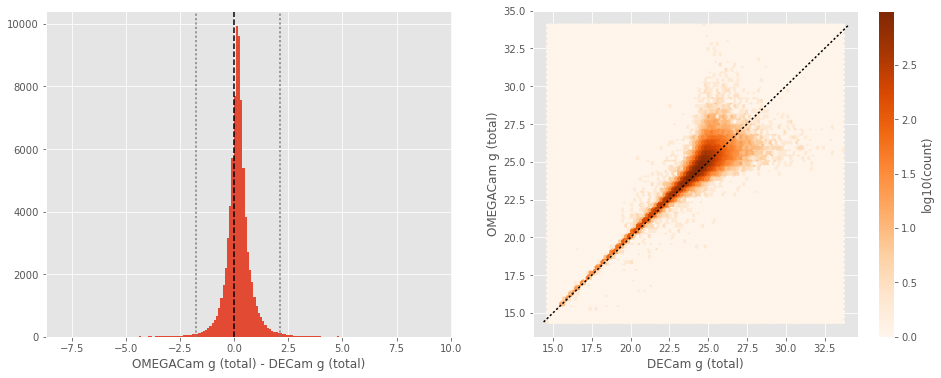

SUPRIME g (aperture) - DECam g (aperture):
- Median: 0.12
- Median Absolute Deviation: 0.31
- 1% percentile: -2.6937606811523436
- 99% percentile: 3.992506446838397


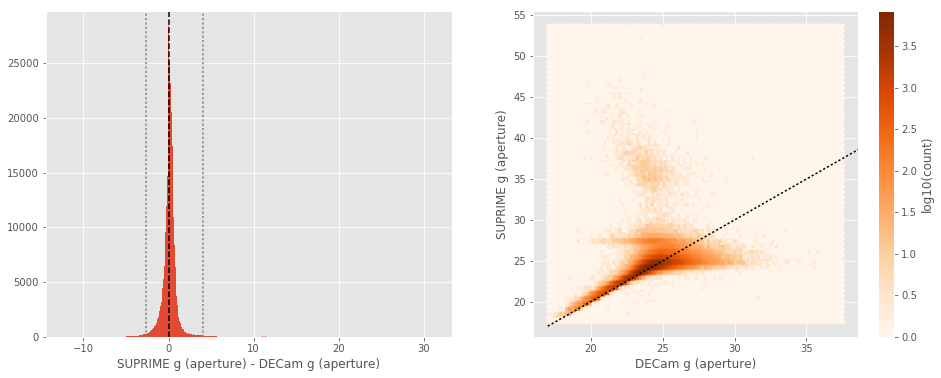

SUPRIME g (total) - DECam g (total):
- Median: -0.16
- Median Absolute Deviation: 0.23
- 1% percentile: -2.4316715240478515
- 99% percentile: 3.1994380950927463


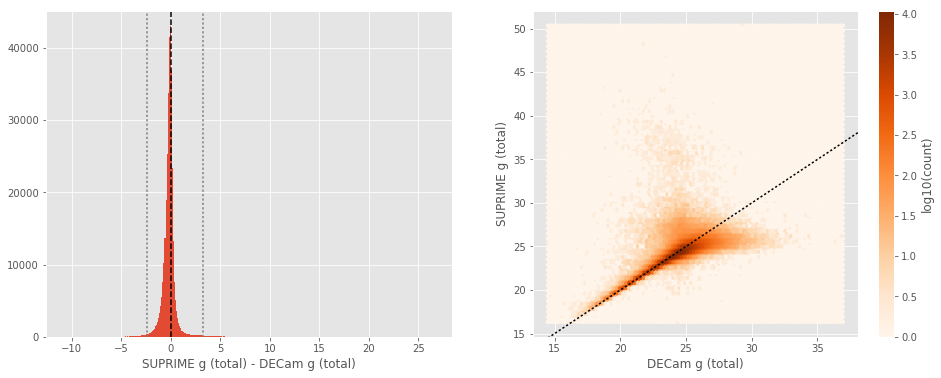

GPC1 g (aperture) - DECam g (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.31
- 1% percentile: -3.197637596130371
- 99% percentile: 2.644296550750723


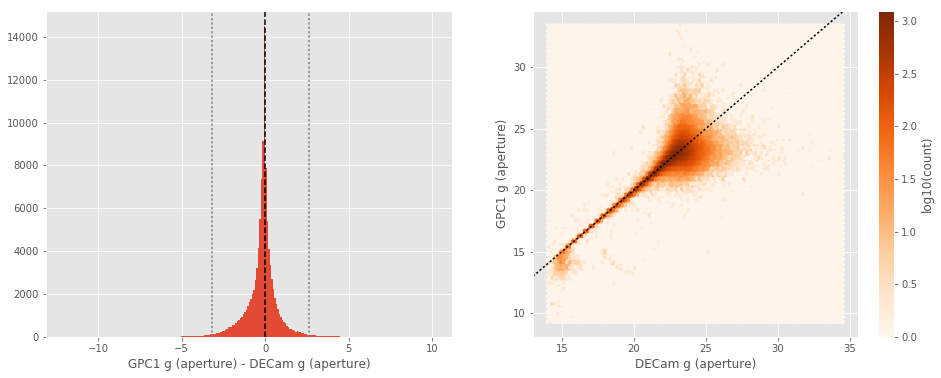

GPC1 g (total) - DECam g (total):
- Median: -0.00
- Median Absolute Deviation: 0.29
- 1% percentile: -3.656358833312988
- 99% percentile: 2.045563468933105


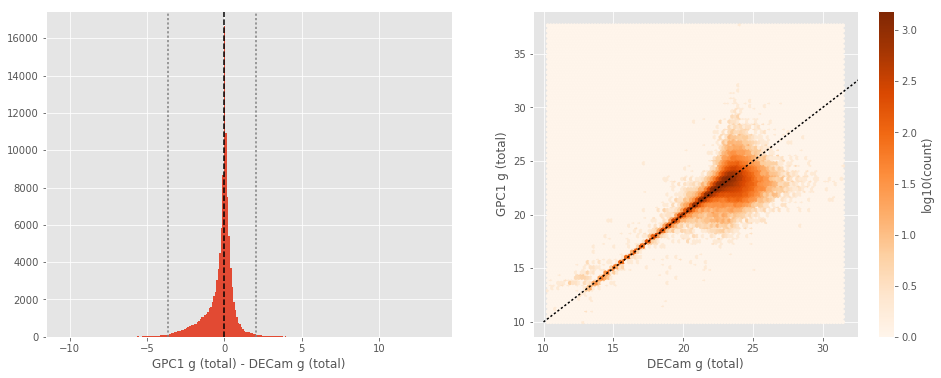

SUPRIME g (aperture) - OMEGACam g (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -2.0122363662719724
- 99% percentile: 1.309205894470203


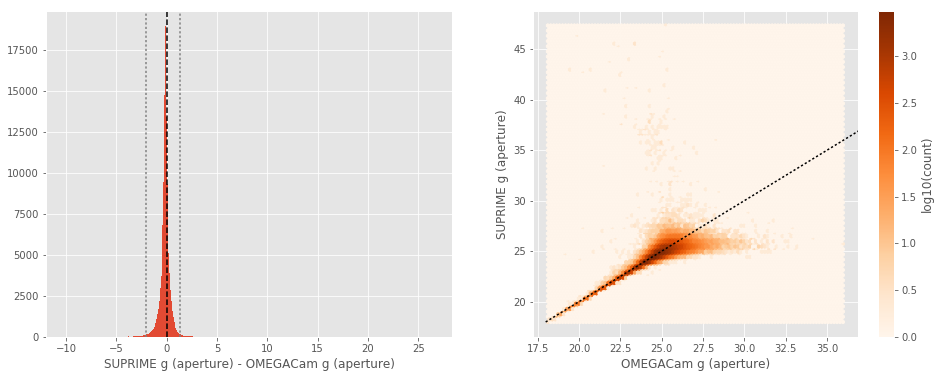

SUPRIME g (total) - OMEGACam g (total):
- Median: -0.44
- Median Absolute Deviation: 0.31
- 1% percentile: -3.19238166809082
- 99% percentile: 1.4302340698242428


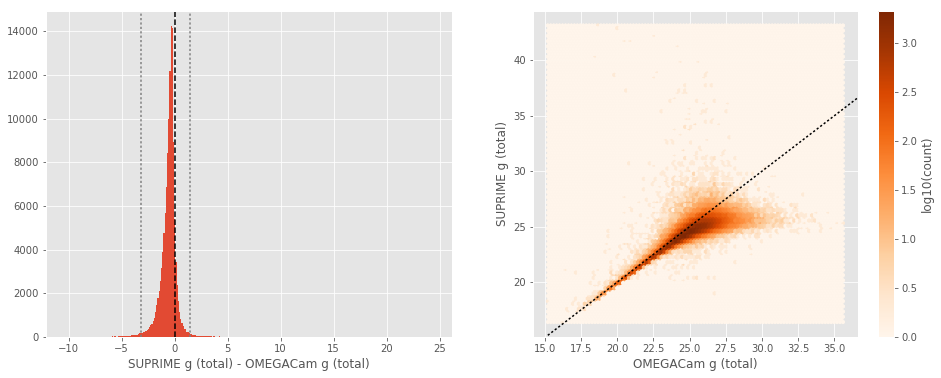

GPC1 g (aperture) - OMEGACam g (aperture):
- Median: -0.39
- Median Absolute Deviation: 0.38
- 1% percentile: -3.108083953857422
- 99% percentile: 2.434363727569579


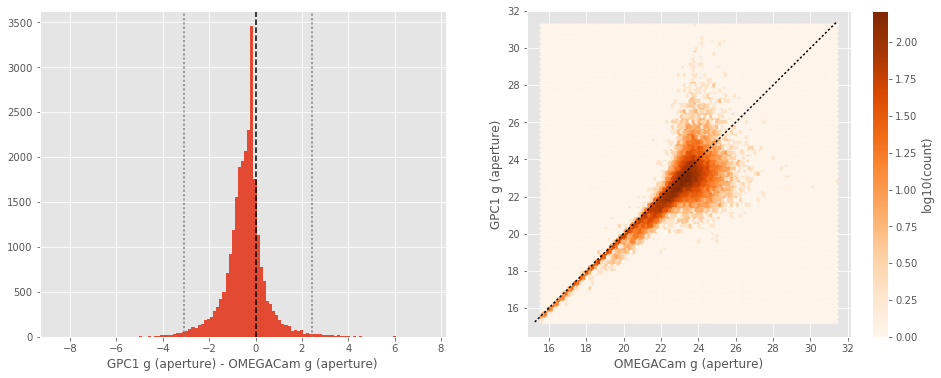

GPC1 g (total) - OMEGACam g (total):
- Median: -0.18
- Median Absolute Deviation: 0.30
- 1% percentile: -3.919437255859375
- 99% percentile: 1.9014898681640615


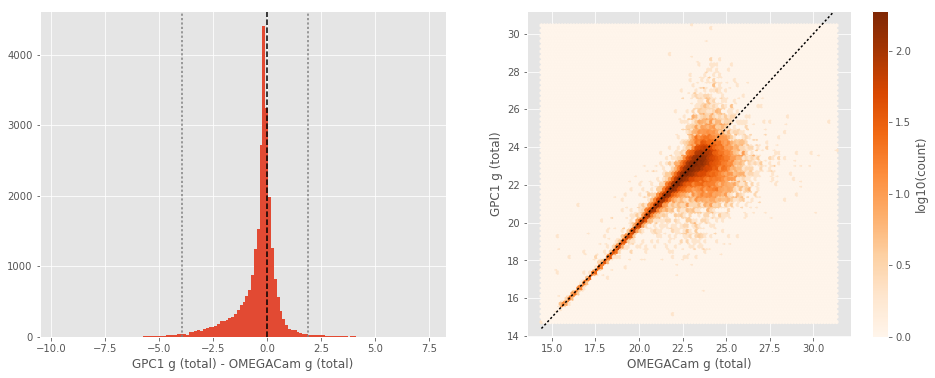

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.33
- Median Absolute Deviation: 0.45
- 1% percentile: -5.574190330505371
- 99% percentile: 2.6066500473022476


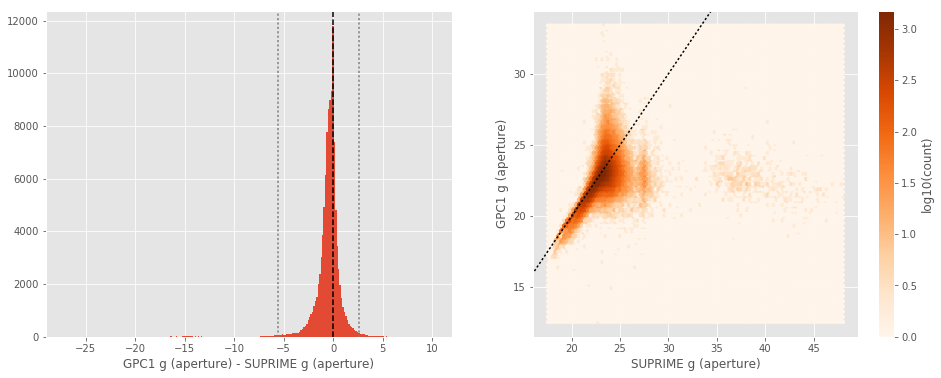

GPC1 g (total) - SUPRIME g (total):
- Median: -0.04
- Median Absolute Deviation: 0.36
- 1% percentile: -5.368672294616699
- 99% percentile: 2.1182360458374014


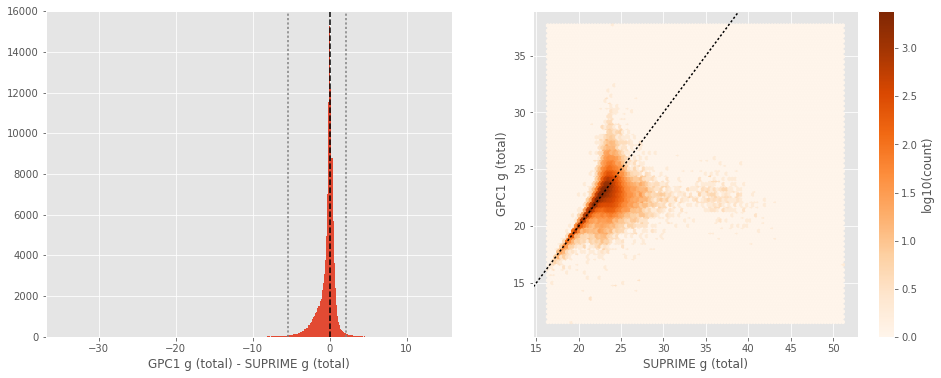

DECam r (aperture) - Megacam r (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -1.0357360649108887
- 99% percentile: 2.2620508766174314


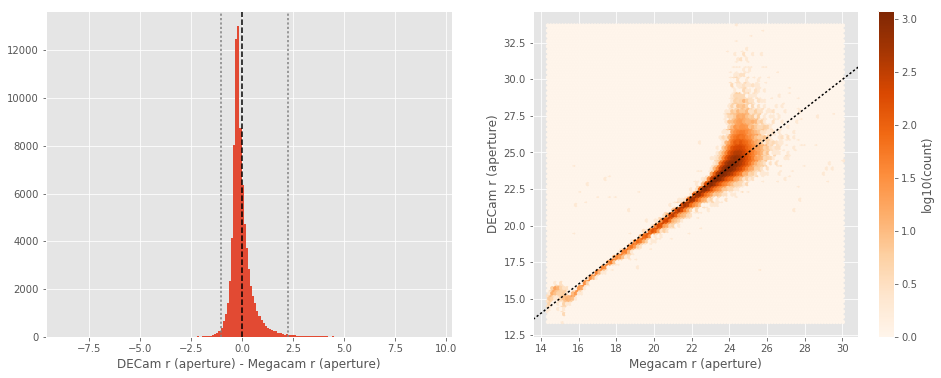

DECam r (total) - Megacam r (total):
- Median: 0.08
- Median Absolute Deviation: 0.20
- 1% percentile: -0.7194135856628417
- 99% percentile: 1.709892120361331


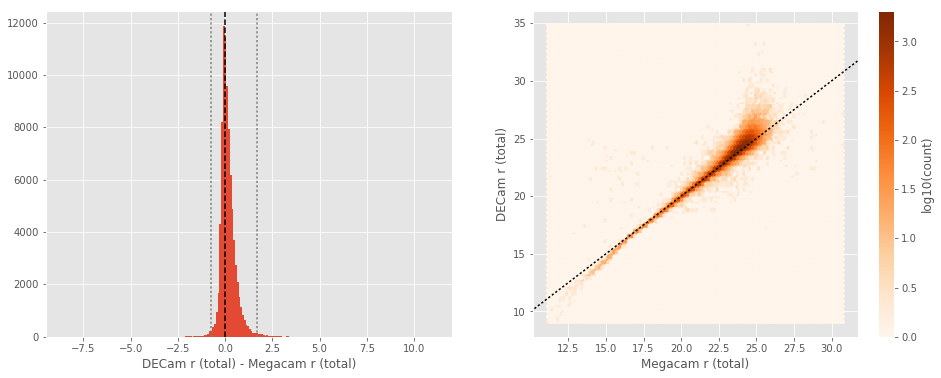

OMEGACam r (aperture) - Megacam r (aperture):
- Median: 0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -0.8439453506469727
- 99% percentile: 0.9190123748779302


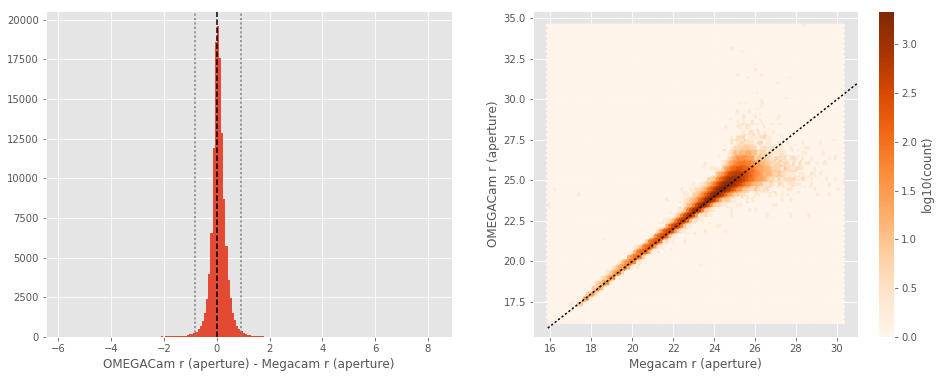

OMEGACam r (total) - Megacam r (total):
- Median: 0.20
- Median Absolute Deviation: 0.18
- 1% percentile: -0.749367790222168
- 99% percentile: 1.427065830230712


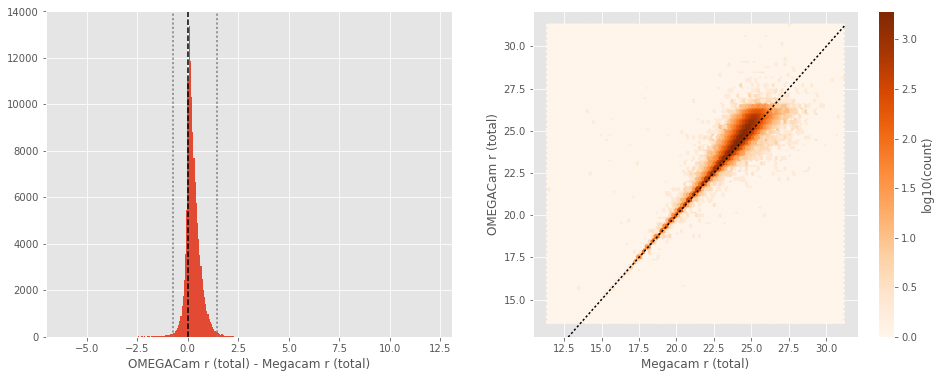

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.5395031356811524
- 99% percentile: 1.7156336593627914


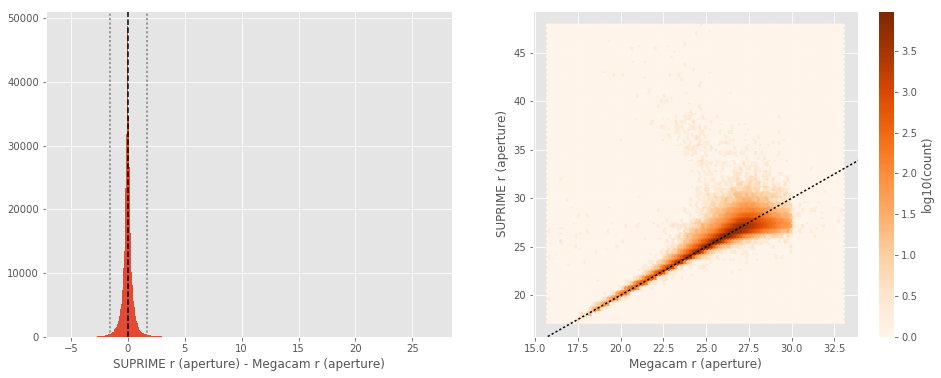

SUPRIME r (total) - Megacam r (total):
- Median: -0.10
- Median Absolute Deviation: 0.22
- 1% percentile: -2.5467380714416503
- 99% percentile: 2.2248780059814535


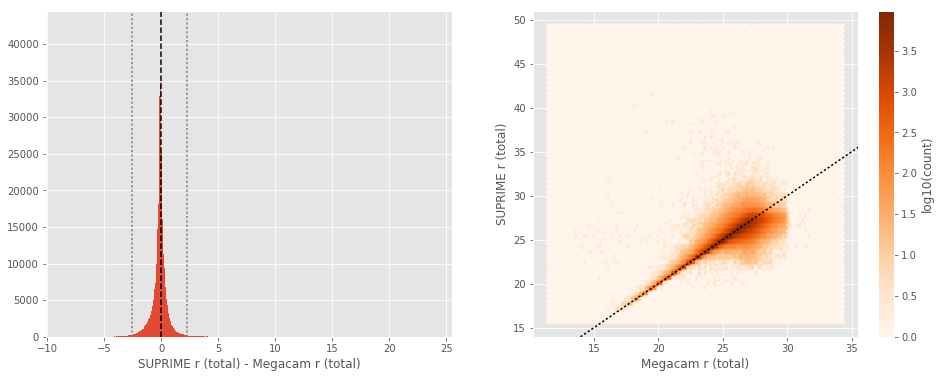

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.21
- 1% percentile: -2.1942799758911136
- 99% percentile: 1.6077803039550798


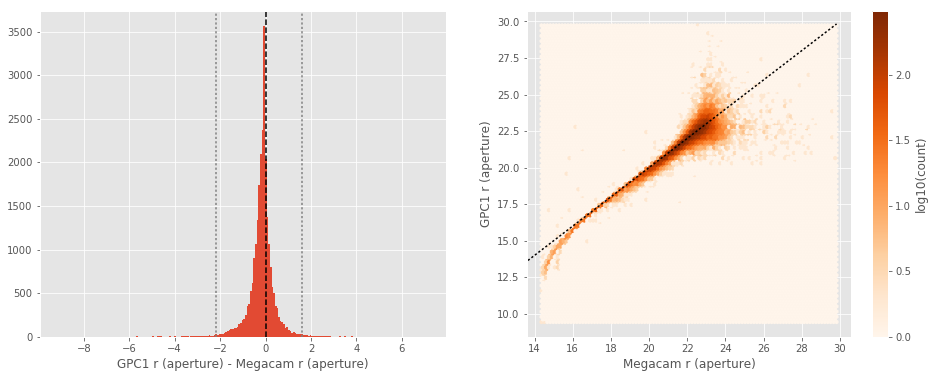

GPC1 r (total) - Megacam r (total):
- Median: 0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -2.6401522827148436
- 99% percentile: 1.4628974342346184


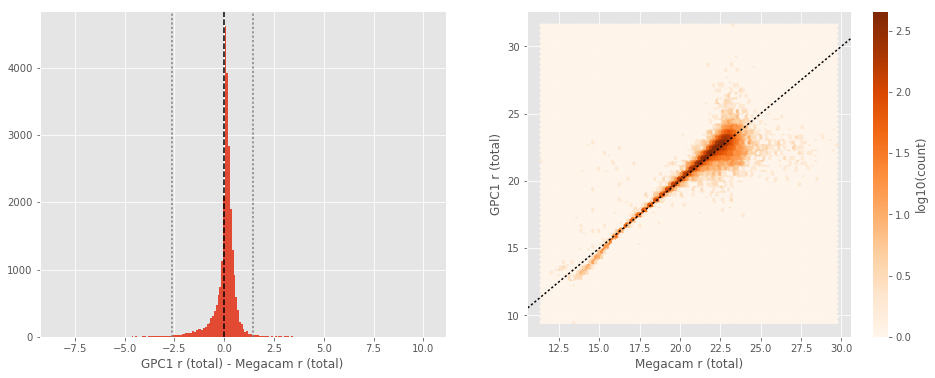

OMEGACam r (aperture) - DECam r (aperture):
- Median: 0.19
- Median Absolute Deviation: 0.24
- 1% percentile: -2.0809104156494143
- 99% percentile: 1.1332830810546874


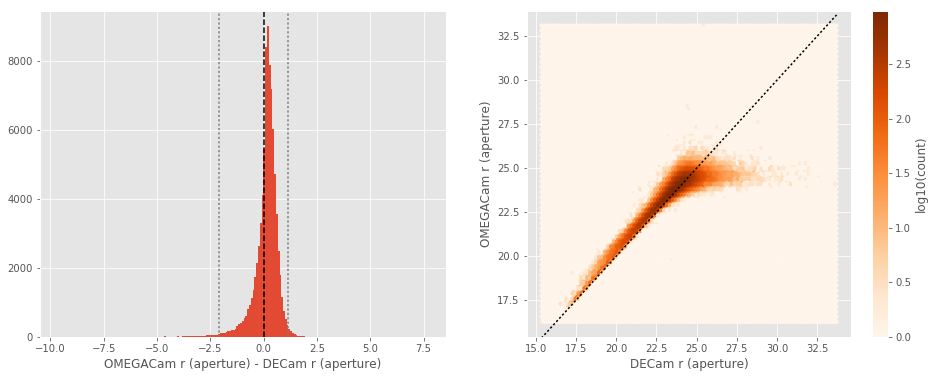

OMEGACam r (total) - DECam r (total):
- Median: 0.11
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1362020111083986
- 99% percentile: 1.1351058959960851


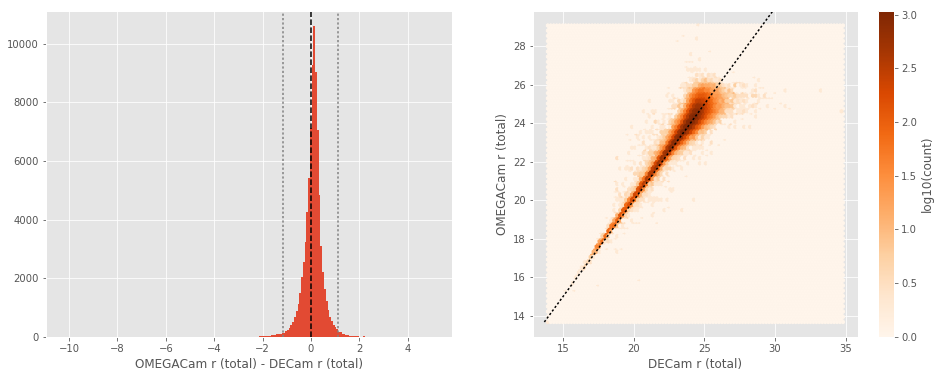

SUPRIME r (aperture) - DECam r (aperture):
- Median: 0.18
- Median Absolute Deviation: 0.27
- 1% percentile: -2.1635351181030273
- 99% percentile: 14.46567520141598


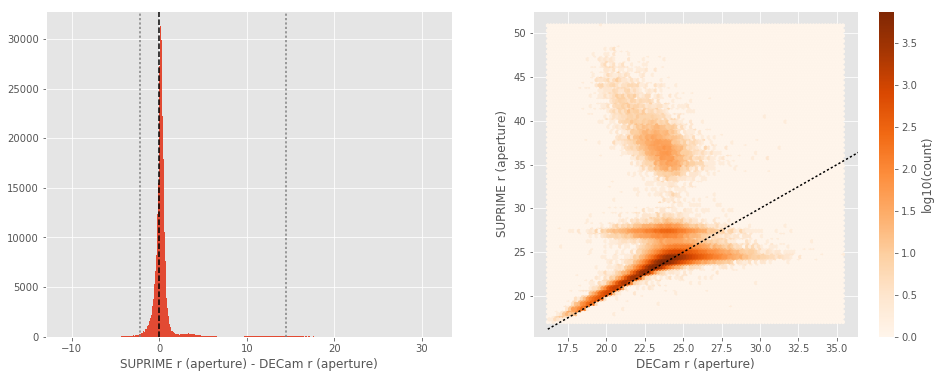

SUPRIME r (total) - DECam r (total):
- Median: -0.07
- Median Absolute Deviation: 0.21
- 1% percentile: -1.6292112731933592
- 99% percentile: 10.36987854003906


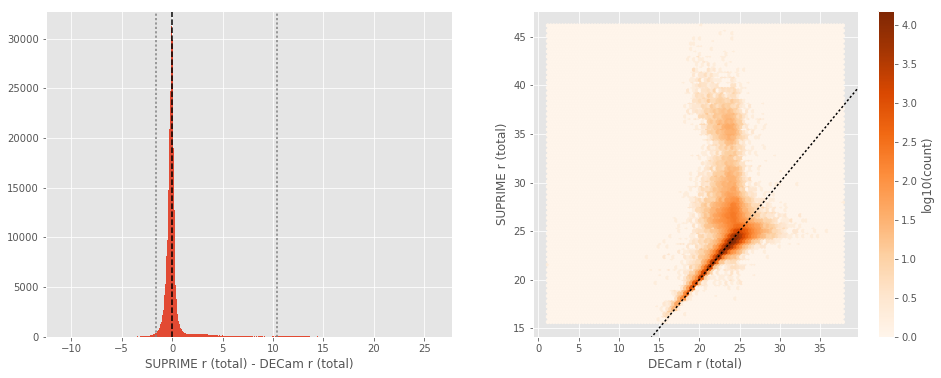

GPC1 r (aperture) - DECam r (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.18
- 1% percentile: -1.944691390991211
- 99% percentile: 1.8248910522460917


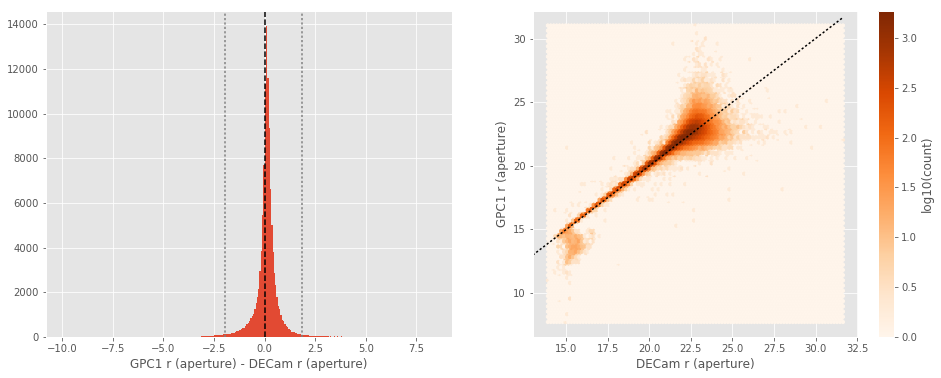

GPC1 r (total) - DECam r (total):
- Median: 0.19
- Median Absolute Deviation: 0.17
- 1% percentile: -2.194650650024414
- 99% percentile: 1.6236286163330078


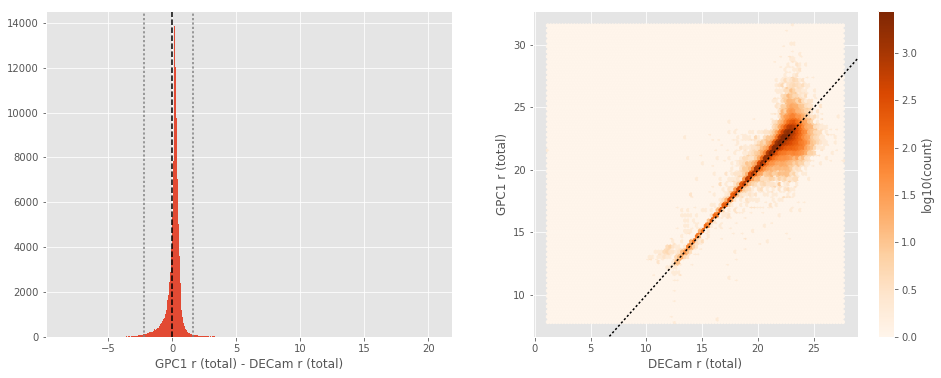

SUPRIME r (aperture) - OMEGACam r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8950608062744141
- 99% percentile: 1.3190444946289006


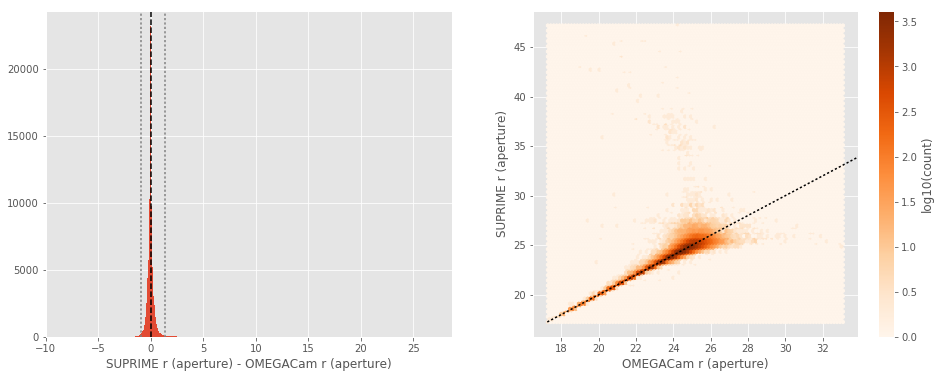

SUPRIME r (total) - OMEGACam r (total):
- Median: -0.25
- Median Absolute Deviation: 0.19
- 1% percentile: -1.4157127380371093
- 99% percentile: 1.6127704620361283


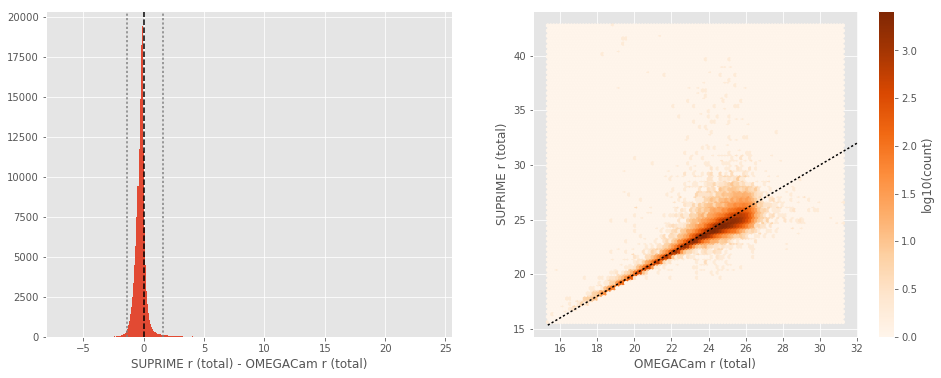

GPC1 r (aperture) - OMEGACam r (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.26
- 1% percentile: -1.7939163589477538
- 99% percentile: 1.605987358093261


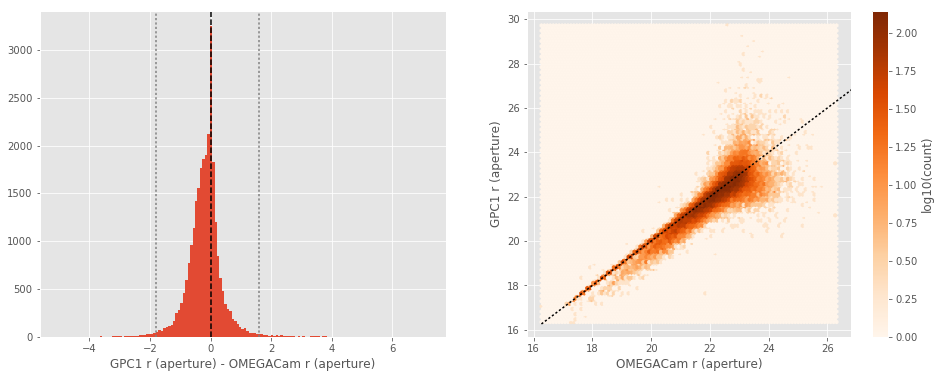

GPC1 r (total) - OMEGACam r (total):
- Median: 0.04
- Median Absolute Deviation: 0.16
- 1% percentile: -2.334157943725586
- 99% percentile: 1.2207813262939446


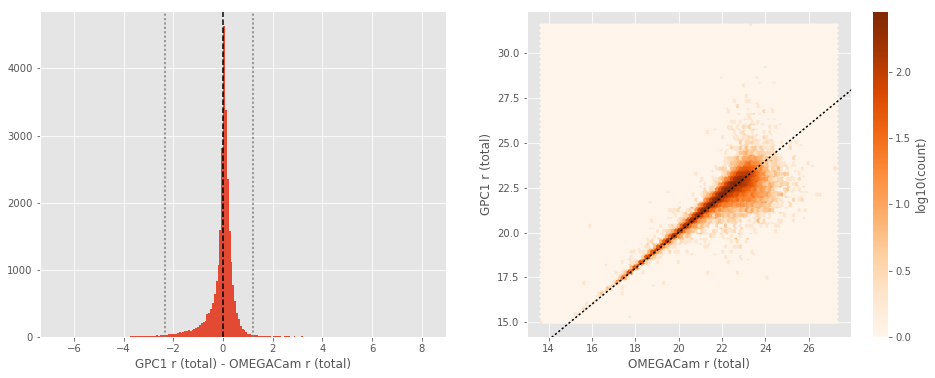

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.30
- 1% percentile: -17.871509017944337
- 99% percentile: 1.6664178848266584


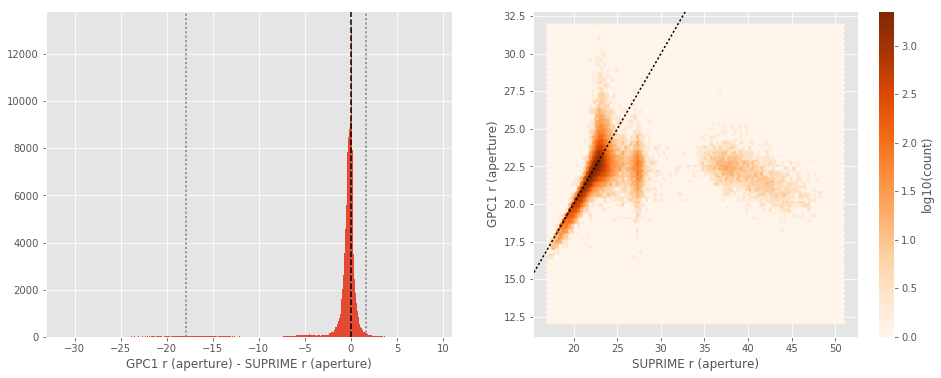

GPC1 r (total) - SUPRIME r (total):
- Median: 0.14
- Median Absolute Deviation: 0.21
- 1% percentile: -13.293508720397949
- 99% percentile: 1.428863525390624


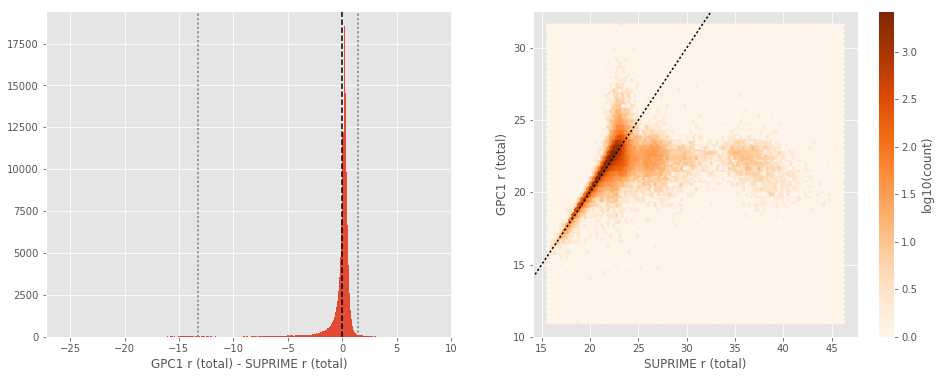

OMEGACam i (aperture) - Megacam i (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.23
- 1% percentile: -1.2771854400634766
- 99% percentile: 2.2827608108520505


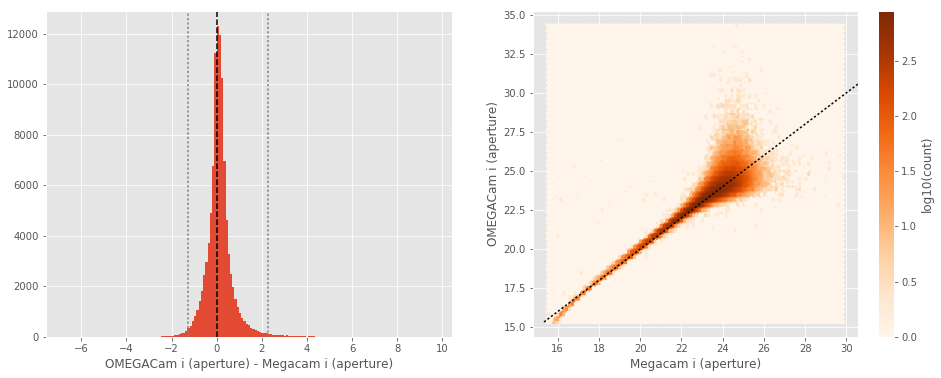

OMEGACam i (total) - Megacam i (total):
- Median: 0.31
- Median Absolute Deviation: 0.30
- 1% percentile: -0.9247077941894531
- 99% percentile: 3.3741300582885736


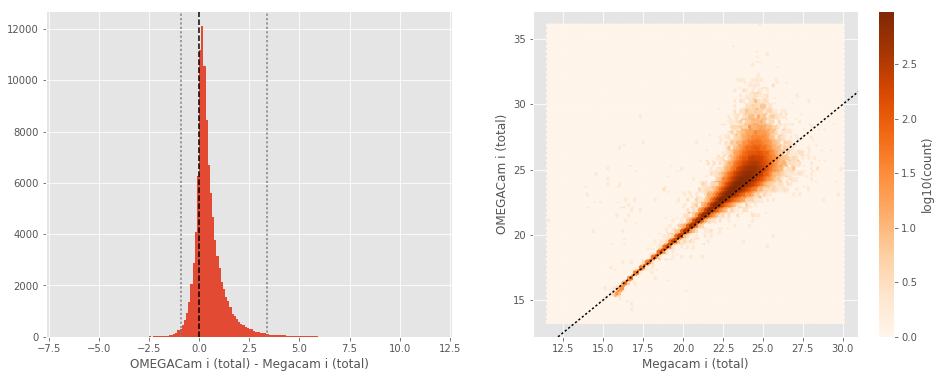

SUPRIME i (aperture) - Megacam i (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.18
- 1% percentile: -1.679243698120117
- 99% percentile: 1.779090881347643


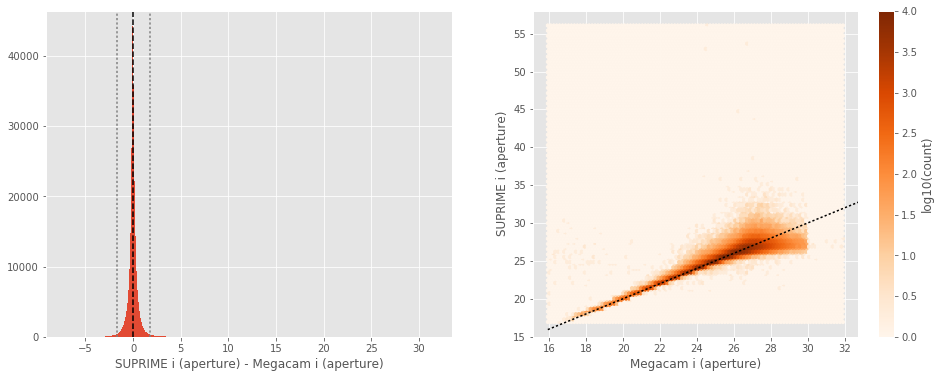

SUPRIME i (total) - Megacam i (total):
- Median: -0.08
- Median Absolute Deviation: 0.24
- 1% percentile: -2.680943222045898
- 99% percentile: 2.215664672851562


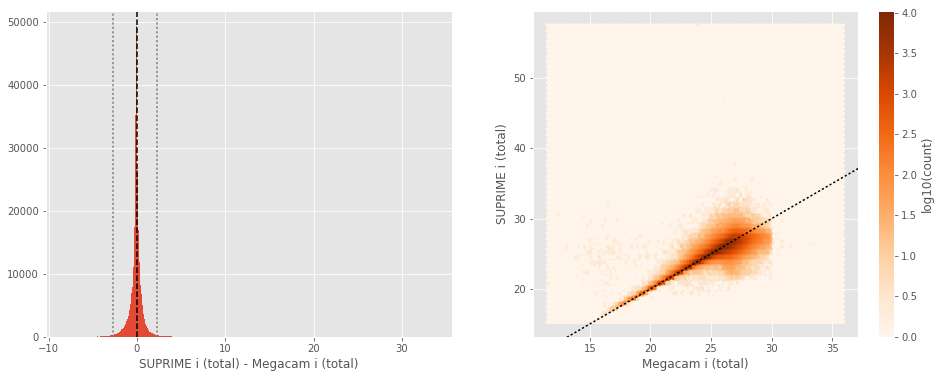

GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.10
- Median Absolute Deviation: 0.16
- 1% percentile: -1.6688246726989746
- 99% percentile: 1.280550479888916


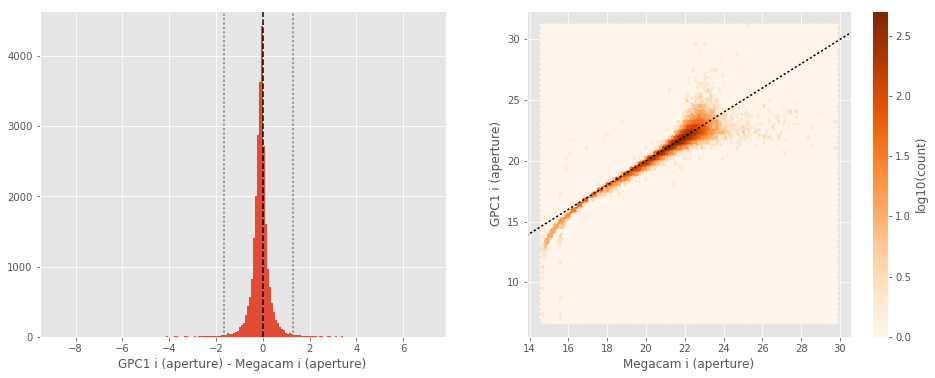

GPC1 i (total) - Megacam i (total):
- Median: 0.16
- Median Absolute Deviation: 0.13
- 1% percentile: -1.484436664581299
- 99% percentile: 1.118515129089356


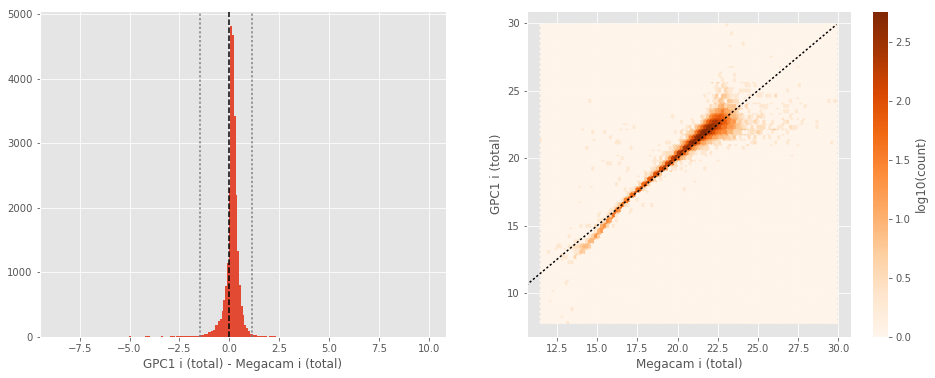

SUPRIME i (aperture) - OMEGACam i (aperture):
- Median: -0.06
- Median Absolute Deviation: 0.23
- 1% percentile: -2.2401300048828126
- 99% percentile: 1.4570802307128905


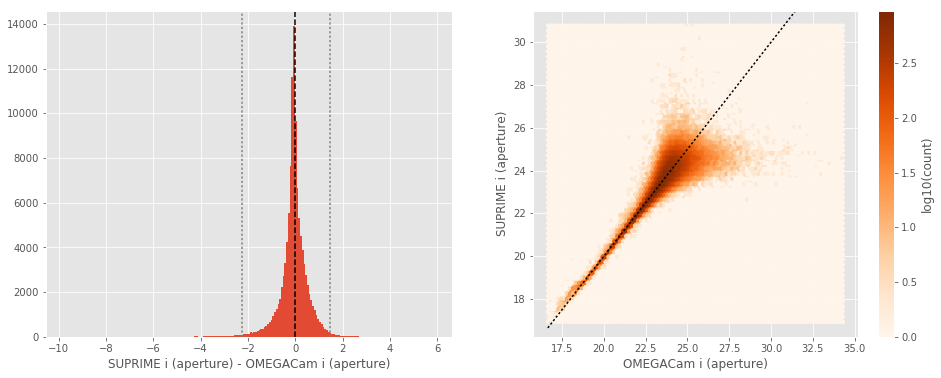

SUPRIME i (total) - OMEGACam i (total):
- Median: -0.33
- Median Absolute Deviation: 0.32
- 1% percentile: -3.381352691650391
- 99% percentile: 1.3634735107421871


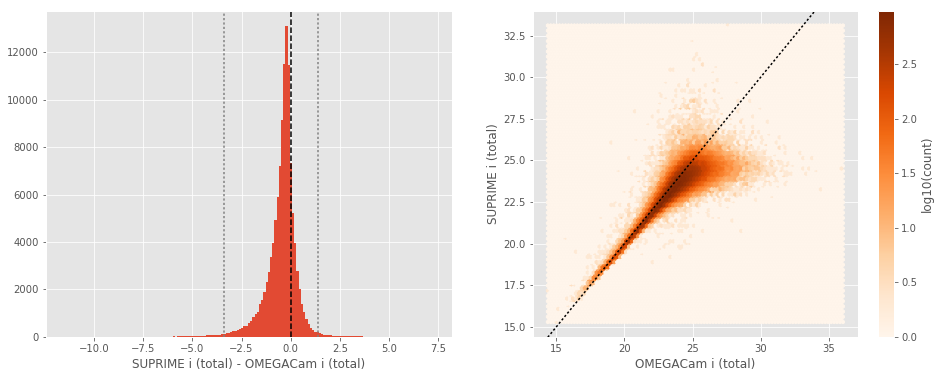

GPC1 i (aperture) - OMEGACam i (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.21
- 1% percentile: -1.3513908195495603
- 99% percentile: 1.1719453048706063


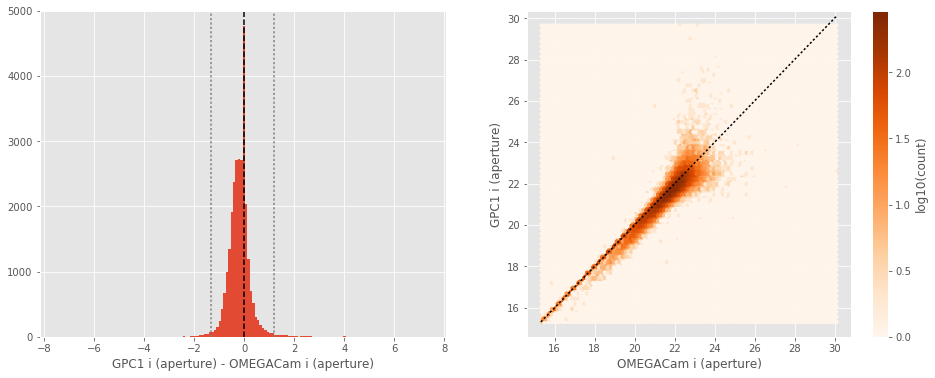

GPC1 i (total) - OMEGACam i (total):
- Median: 0.01
- Median Absolute Deviation: 0.14
- 1% percentile: -1.627739009857178
- 99% percentile: 0.9032410049438482


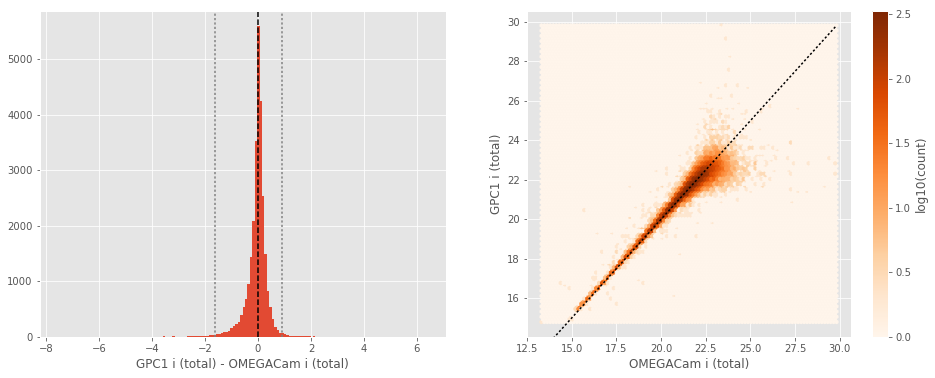

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.23
- 1% percentile: -1.8379167556762694
- 99% percentile: 1.35901165008545


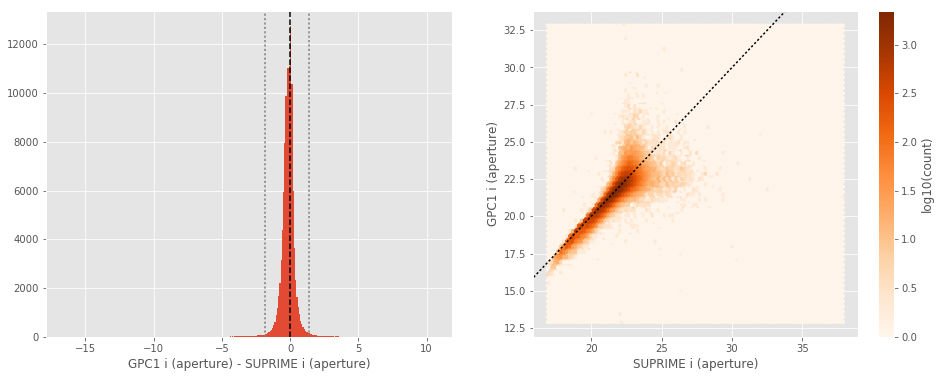

GPC1 i (total) - SUPRIME i (total):
- Median: 0.18
- Median Absolute Deviation: 0.15
- 1% percentile: -1.8483230590820312
- 99% percentile: 1.0811426925659178


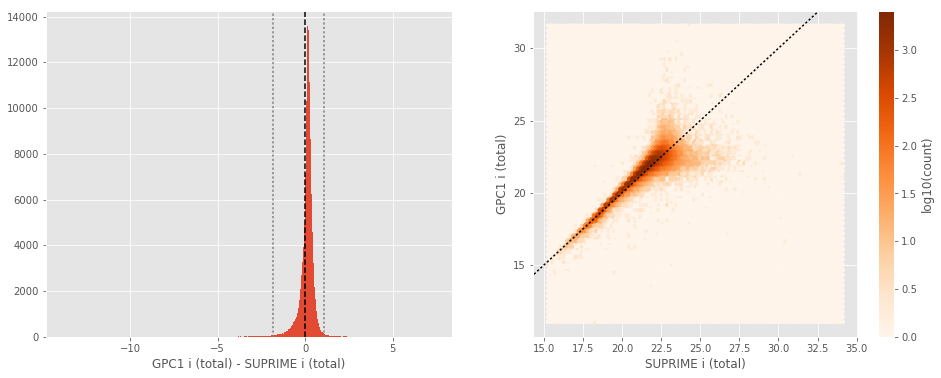

DECam z (aperture) - Megacam z (aperture):
- Median: -0.19
- Median Absolute Deviation: 0.20
- 1% percentile: -1.0989385986328126
- 99% percentile: 2.650307807922356


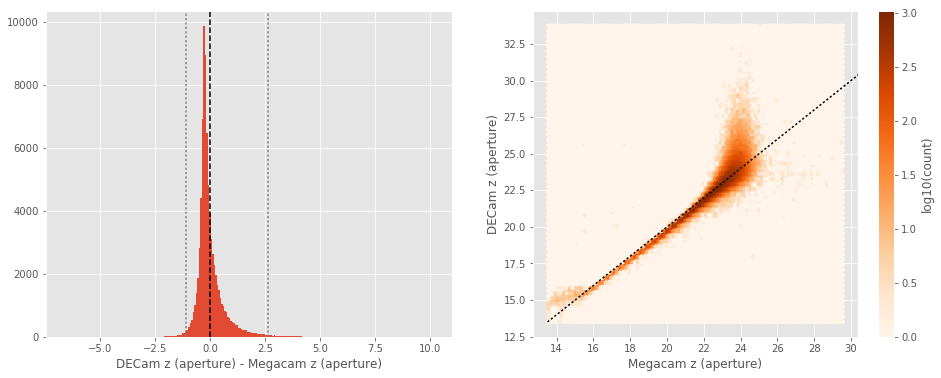

DECam z (total) - Megacam z (total):
- Median: -0.02
- Median Absolute Deviation: 0.17
- 1% percentile: -0.8688444519042969
- 99% percentile: 1.4678274726867706


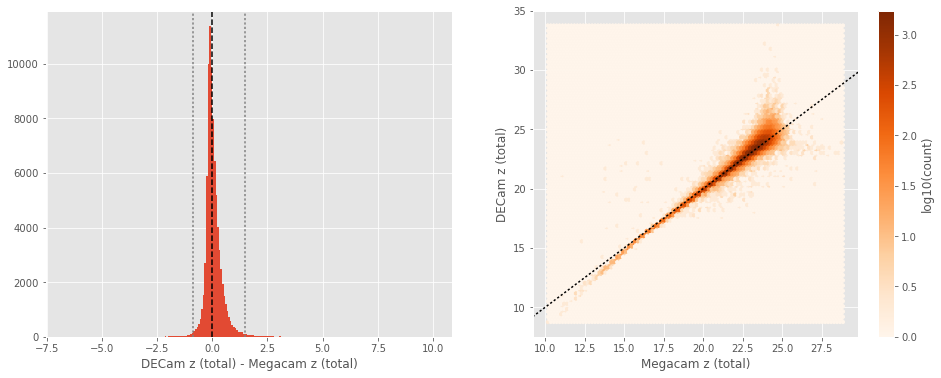

SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.23
- 1% percentile: -2.3434569549560544
- 99% percentile: 2.15307258605957


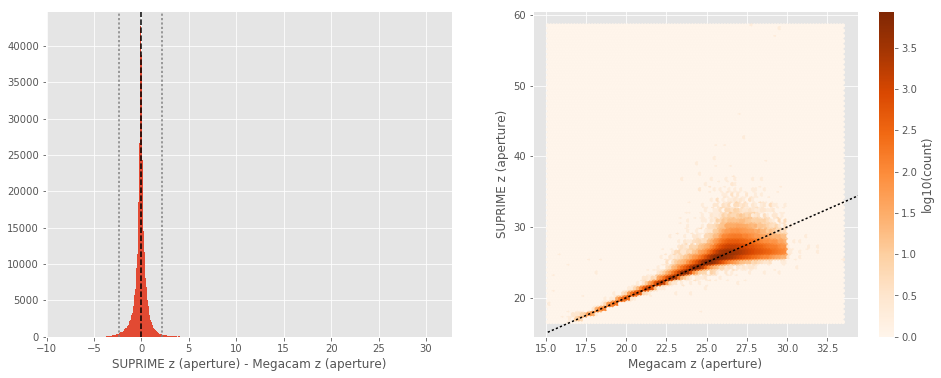

SUPRIME z (total) - Megacam z (total):
- Median: -0.14
- Median Absolute Deviation: 0.29
- 1% percentile: -3.058683300018311
- 99% percentile: 2.3672728538513192


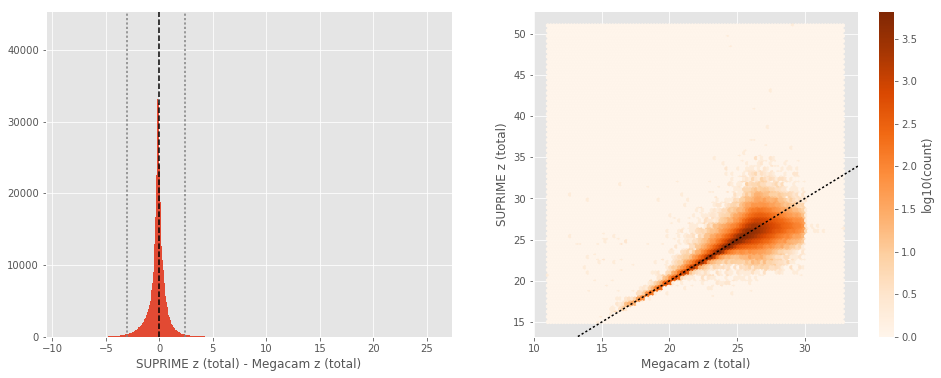

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.18
- 1% percentile: -1.7988469886779783
- 99% percentile: 1.5873984718322791


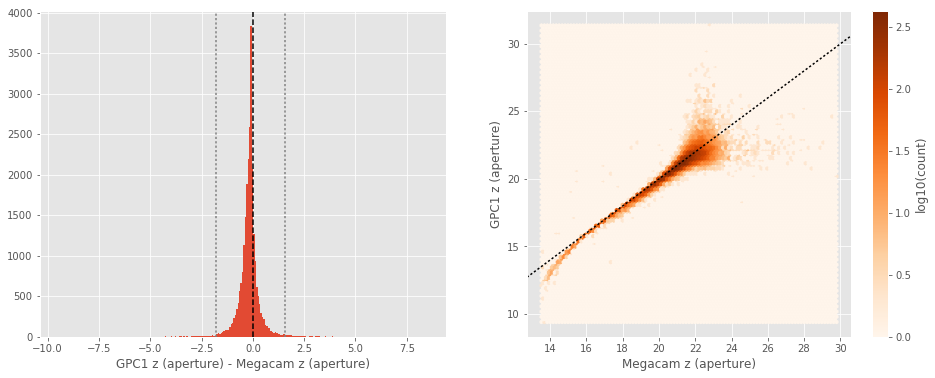

GPC1 z (total) - Megacam z (total):
- Median: 0.10
- Median Absolute Deviation: 0.15
- 1% percentile: -1.9294200897216796
- 99% percentile: 1.4494407653808676


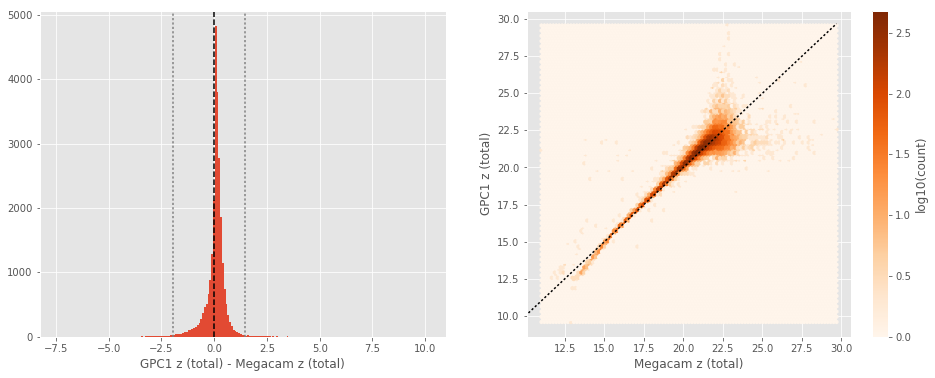

SUPRIME z (aperture) - DECam z (aperture):
- Median: 0.12
- Median Absolute Deviation: 0.25
- 1% percentile: -2.5004561805725096
- 99% percentile: 4.763002719879154


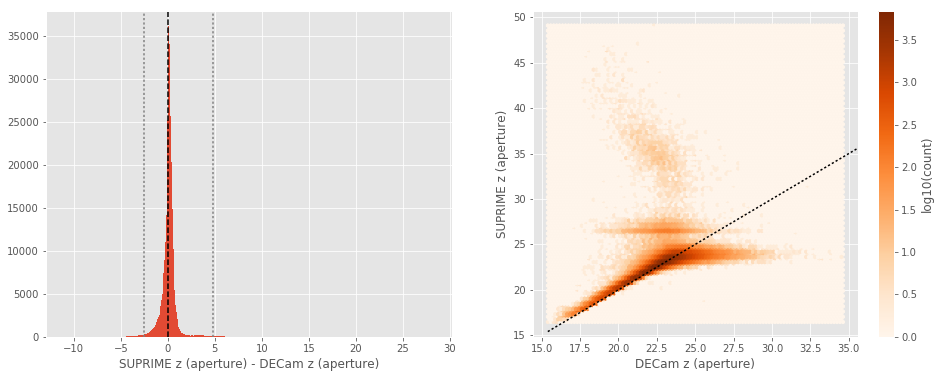

SUPRIME z (total) - DECam z (total):
- Median: -0.06
- Median Absolute Deviation: 0.17
- 1% percentile: -1.443832015991211
- 99% percentile: 3.931979255676256


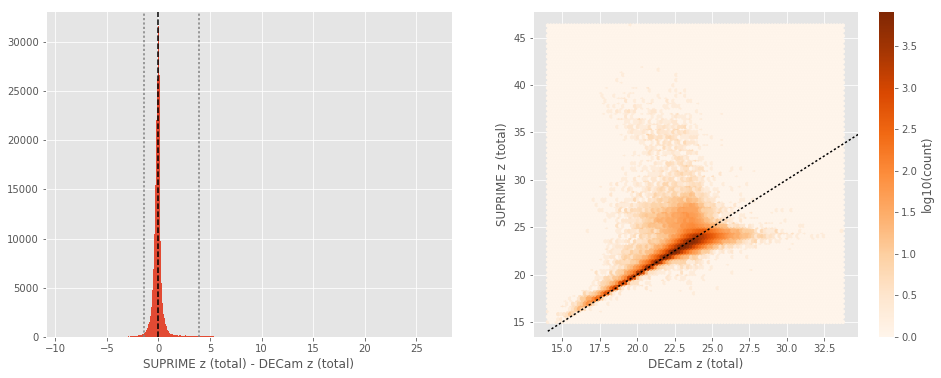

GPC1 z (aperture) - DECam z (aperture):
- Median: 0.12
- Median Absolute Deviation: 0.16
- 1% percentile: -1.844488754272461
- 99% percentile: 1.7412538909912096


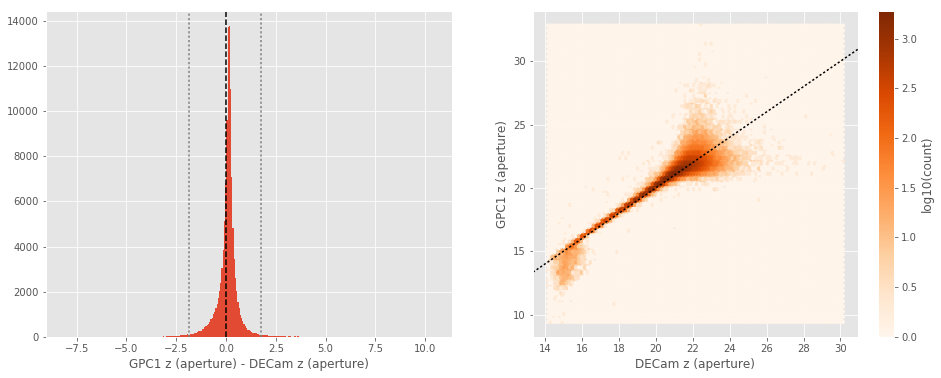

GPC1 z (total) - DECam z (total):
- Median: 0.23
- Median Absolute Deviation: 0.16
- 1% percentile: -1.749343681335449
- 99% percentile: 1.5593233108520559


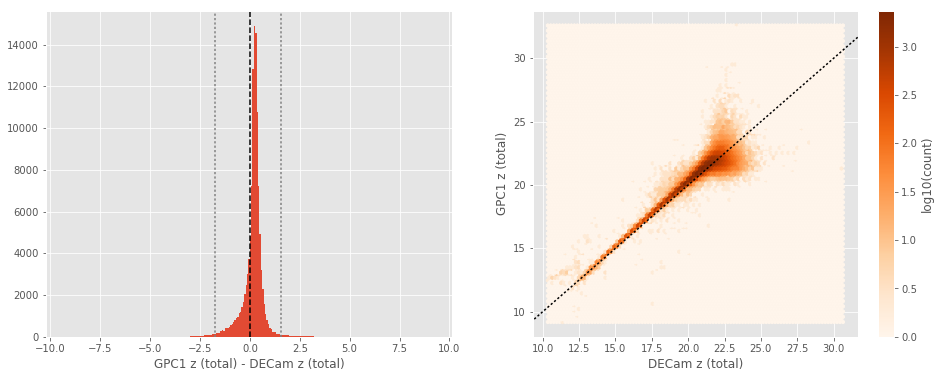

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.26
- 1% percentile: -5.652035140991211
- 99% percentile: 1.673993778228756


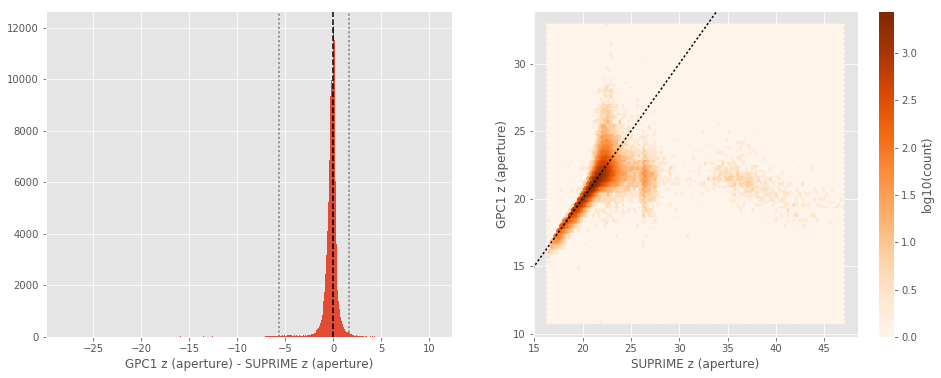

GPC1 z (total) - SUPRIME z (total):
- Median: 0.19
- Median Absolute Deviation: 0.18
- 1% percentile: -5.109778594970703
- 99% percentile: 1.4577860641479492


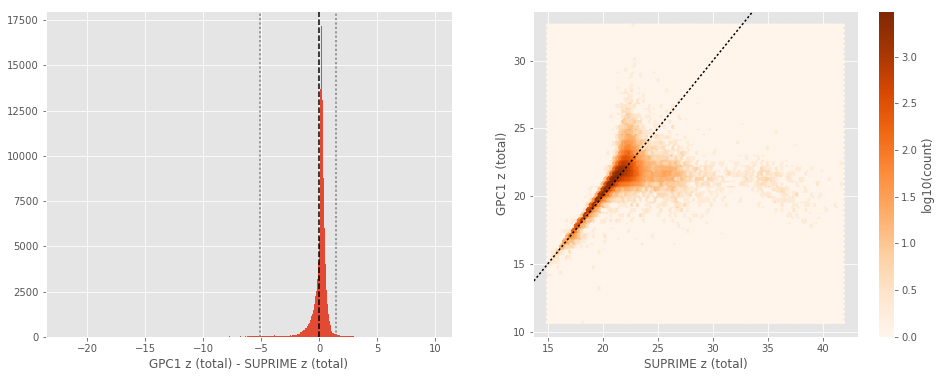

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.40
- Median Absolute Deviation: 0.43
- 1% percentile: -4.734822845458984
- 99% percentile: 1.8781716346740709


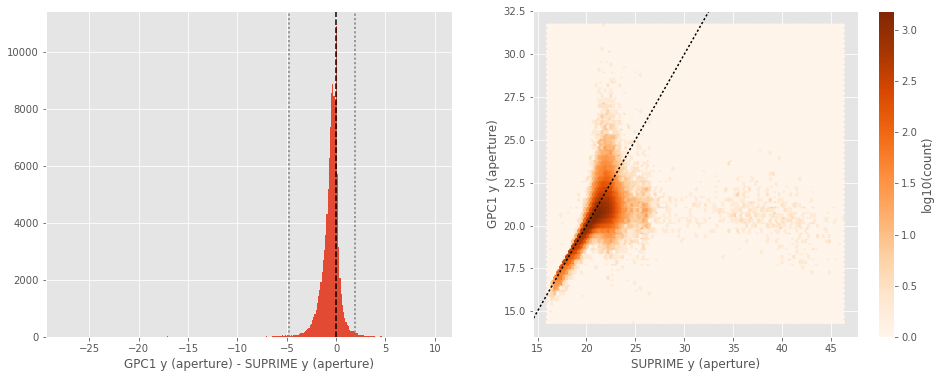

GPC1 y (total) - SUPRIME y (total):
- Median: -0.01
- Median Absolute Deviation: 0.41
- 1% percentile: -4.581078414916992
- 99% percentile: 2.0142618560790995


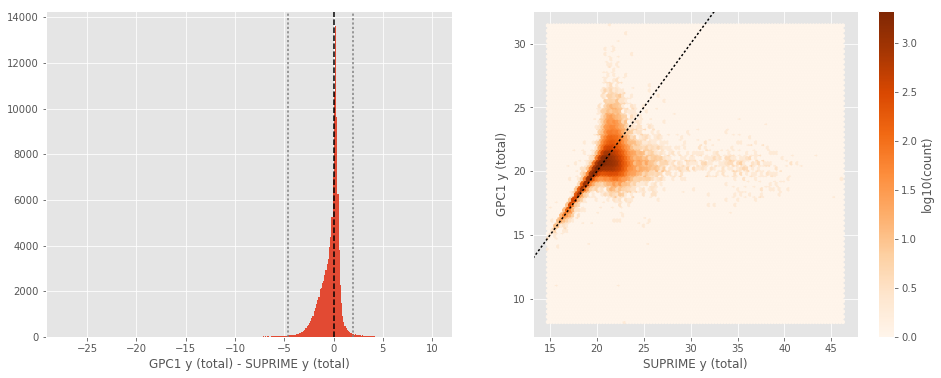

UKIDSS Y (aperture) - SUPRIME y (aperture):
- Median: 0.04
- Median Absolute Deviation: 0.11
- 1% percentile: -5.1563458824157715
- 99% percentile: 0.9319707298278811


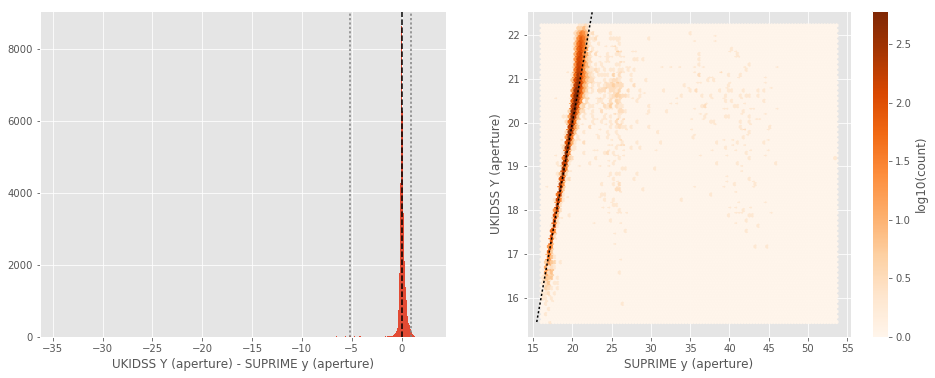

UKIDSS Y (total) - SUPRIME y (total):
- Median: 0.08
- Median Absolute Deviation: 0.16
- 1% percentile: -4.7431103515625
- 99% percentile: 1.152316741943361


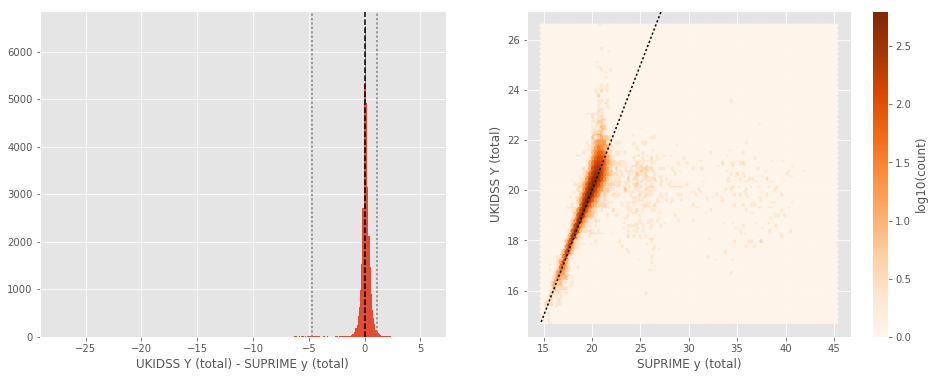

UKIDSS Y (aperture) - GPC1 y (aperture):
- Median: 0.15
- Median Absolute Deviation: 0.22
- 1% percentile: -0.9590471458435059
- 99% percentile: 1.5585036849975573


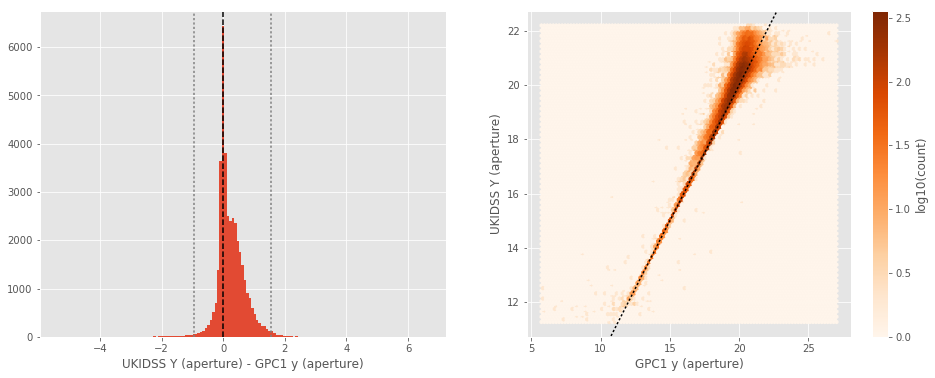

UKIDSS Y (total) - GPC1 y (total):
- Median: -0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1522045135498047
- 99% percentile: 1.3813939094543441


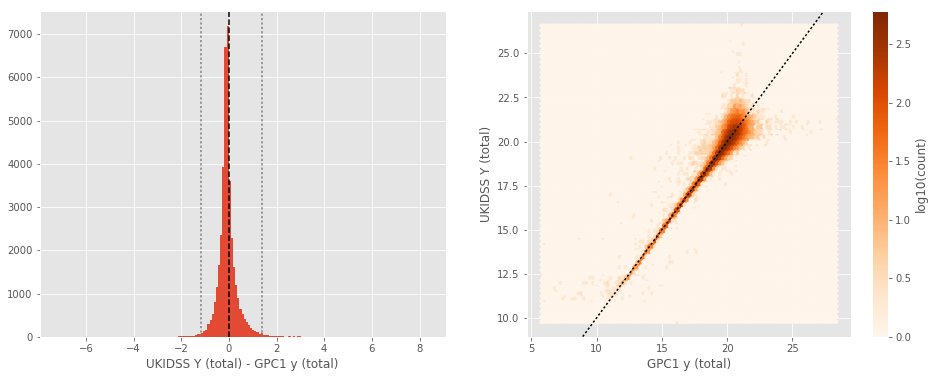

WIRCam J (aperture) - VISTA J (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.18
- 1% percentile: -1.217284164428711
- 99% percentile: 2.489801483154296


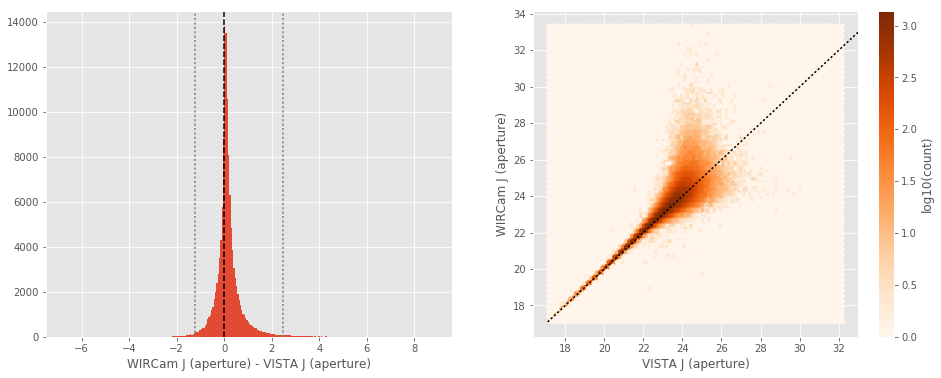

WIRCam J (total) - VISTA J (total):
- Median: 0.17
- Median Absolute Deviation: 0.25
- 1% percentile: -1.4488050079345702
- 99% percentile: 4.207304611206066


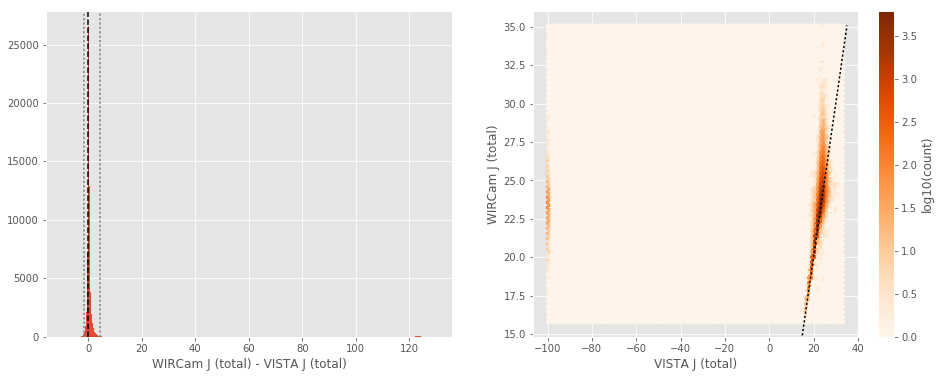

UKIDSS J (aperture) - VISTA J (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.07
- 1% percentile: -4.767954254150391
- 99% percentile: 0.34275646209716853


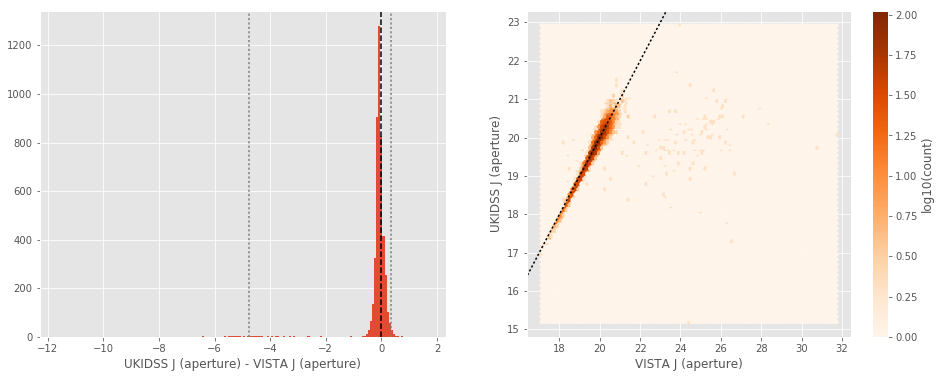

UKIDSS J (total) - VISTA J (total):
- Median: 0.42
- Median Absolute Deviation: 0.22
- 1% percentile: -3.6968894004821777
- 99% percentile: 120.74125701904296


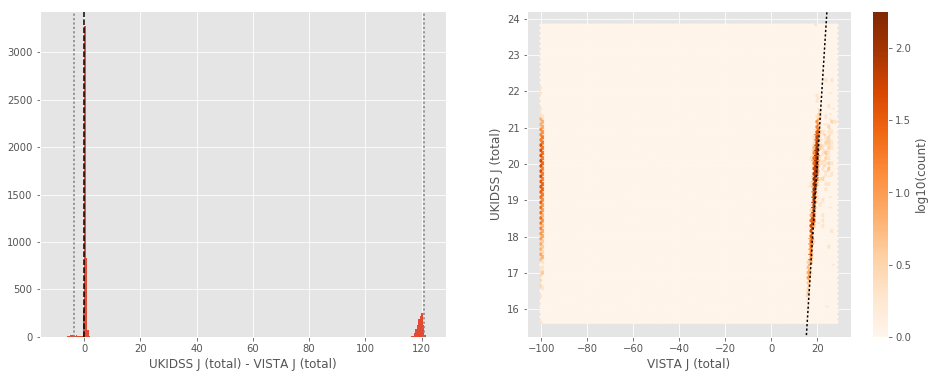

UKIDSS J (aperture) - WIRCam J (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.06
- 1% percentile: -0.7987914085388184
- 99% percentile: 0.31058740615844727


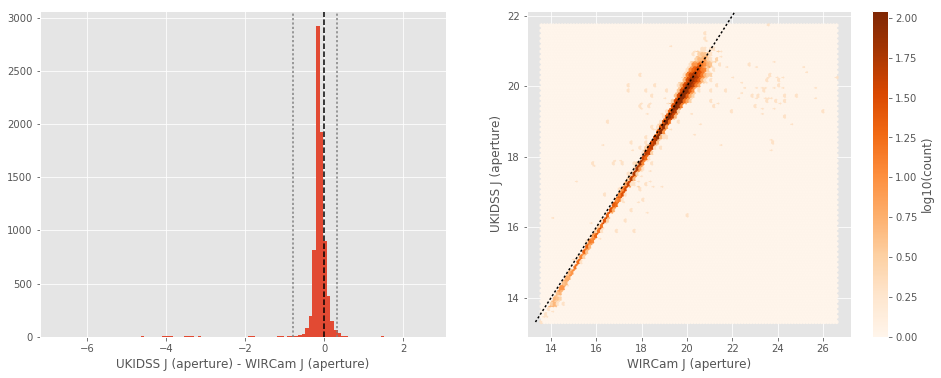

UKIDSS J (total) - WIRCam J (total):
- Median: 0.17
- Median Absolute Deviation: 0.11
- 1% percentile: -0.5228485488891601
- 99% percentile: 1.0357281112670884


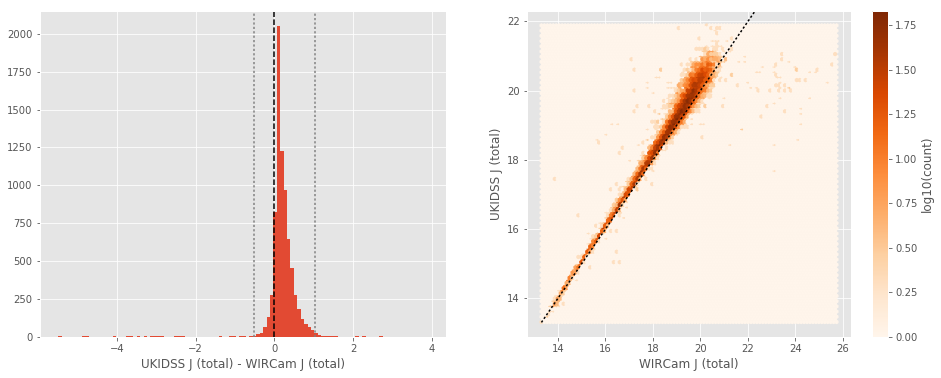

WIRCam H (aperture) - VISTA H (aperture):
- Median: 0.03
- Median Absolute Deviation: 0.28
- 1% percentile: -2.4690948486328126
- 99% percentile: 3.0697425842285164


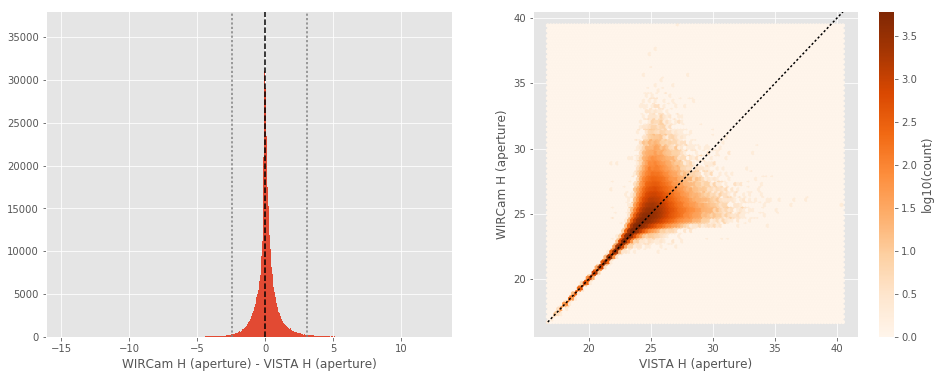

WIRCam H (total) - VISTA H (total):
- Median: 0.16
- Median Absolute Deviation: 0.56
- 1% percentile: -2.5811996459960938
- 99% percentile: 126.78960227966309


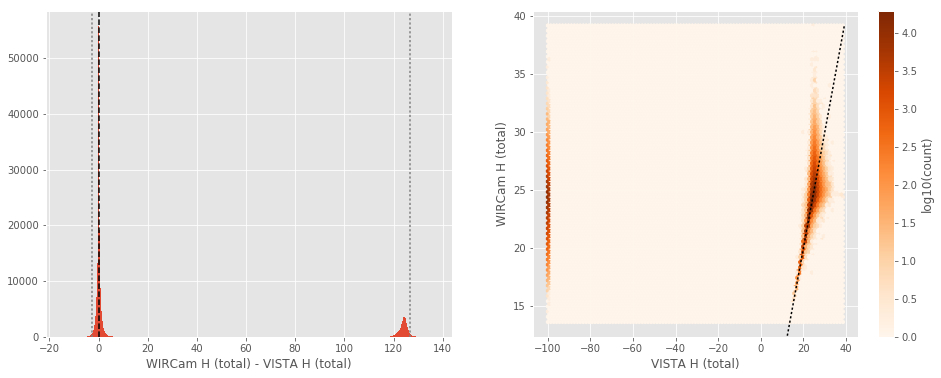

UKIDSS H (aperture) - VISTA H (aperture):
- Median: -0.16
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7533025741577148
- 99% percentile: 0.20724439620971713


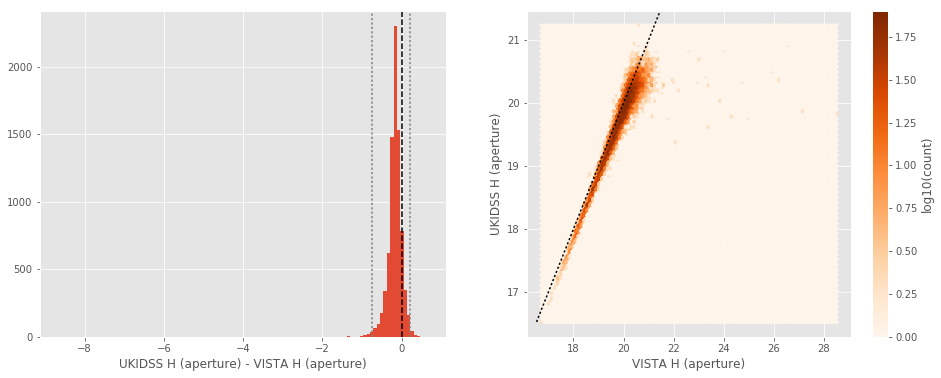

UKIDSS H (total) - VISTA H (total):
- Median: 0.21
- Median Absolute Deviation: 0.25
- 1% percentile: -0.841353988647461
- 99% percentile: 120.62915191650391


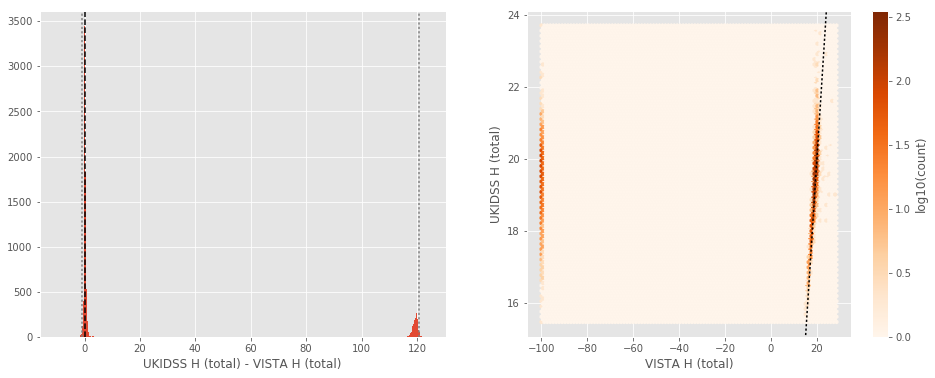

UKIDSS H (aperture) - WIRCam H (aperture):
- Median: -0.10
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7209542846679687
- 99% percentile: 0.2708863830566407


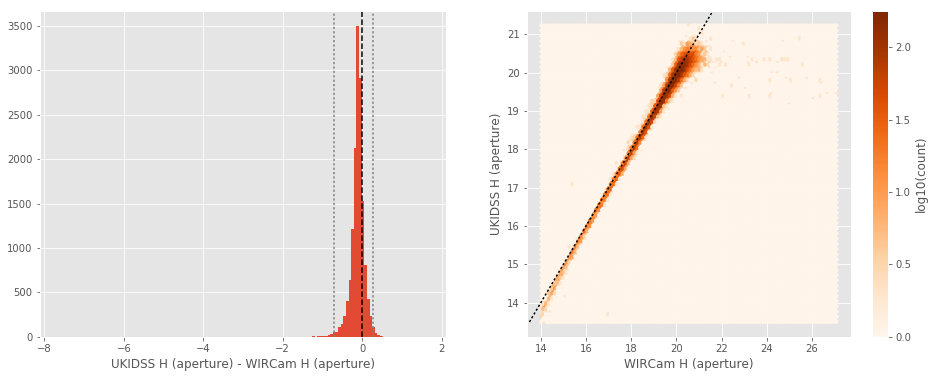

UKIDSS H (total) - WIRCam H (total):
- Median: 0.16
- Median Absolute Deviation: 0.15
- 1% percentile: -0.888087043762207
- 99% percentile: 1.2842176437377941


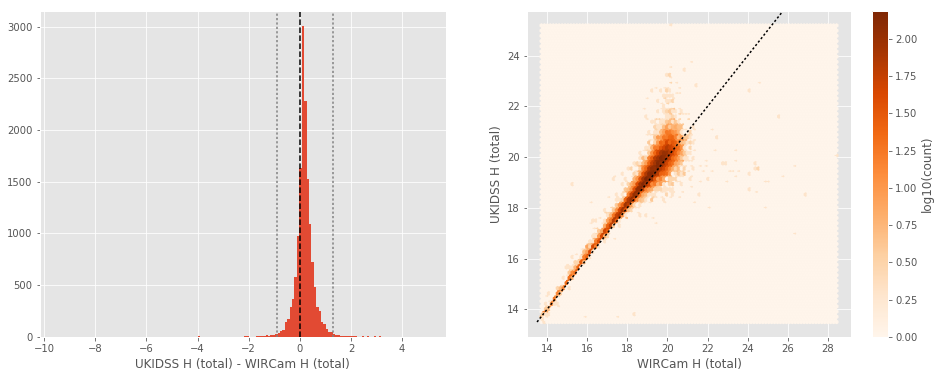

WIRCam Ks (aperture) - VISTA Ks (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.26
- 1% percentile: -2.6148405456542965
- 99% percentile: 2.870211715698239


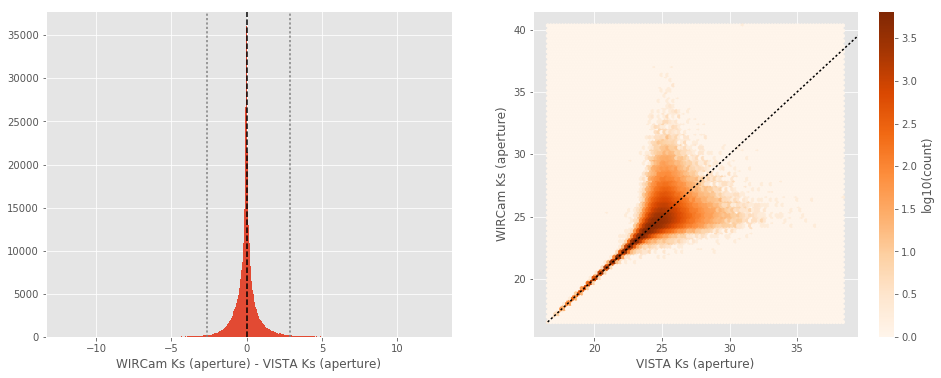

WIRCam Ks (total) - VISTA Ks (total):
- Median: 0.06
- Median Absolute Deviation: 0.56
- 1% percentile: -2.6953111648559567
- 99% percentile: 126.61100791931152


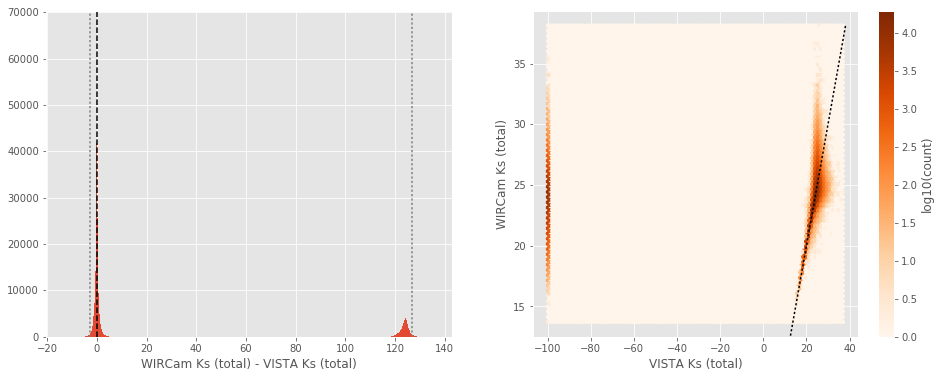

UKIDSS K (aperture) - VISTA Ks (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.09
- 1% percentile: -0.8119423103332519
- 99% percentile: 0.21432039260864238


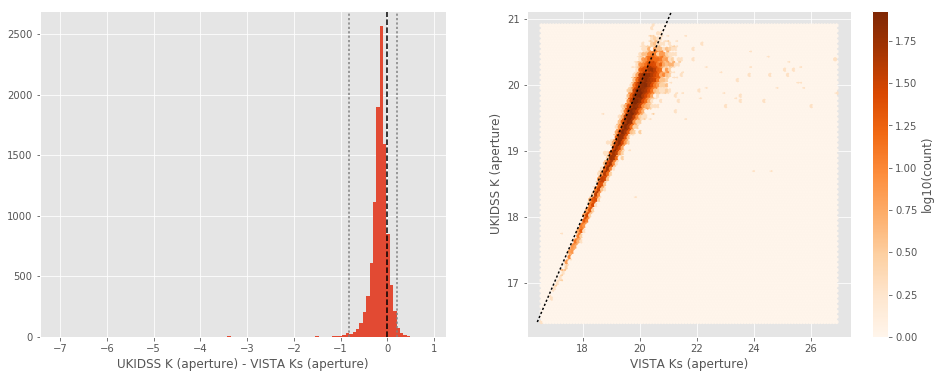

UKIDSS K (total) - VISTA Ks (total):
- Median: 0.20
- Median Absolute Deviation: 0.24
- 1% percentile: -0.841779670715332
- 99% percentile: 120.4788429260254


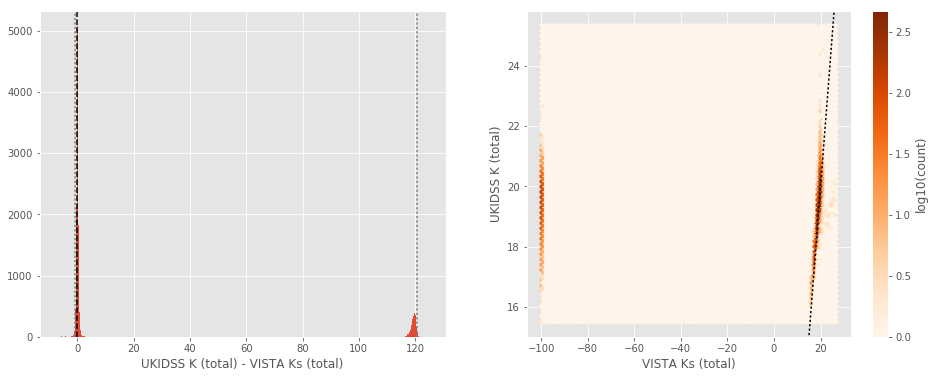

UKIDSS K (aperture) - WIRCam Ks (aperture):
- Median: -0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7296617126464844
- 99% percentile: 0.24024299621581907


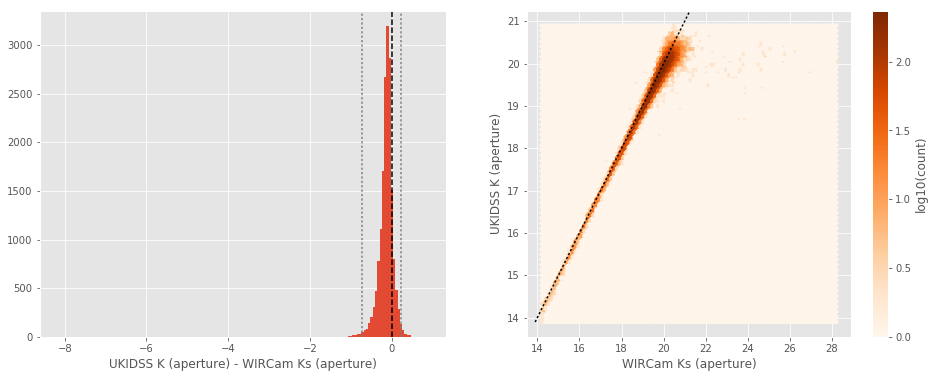

UKIDSS K (total) - WIRCam Ks (total):
- Median: 0.16
- Median Absolute Deviation: 0.15
- 1% percentile: -0.8176431274414062
- 99% percentile: 1.2011849975585909


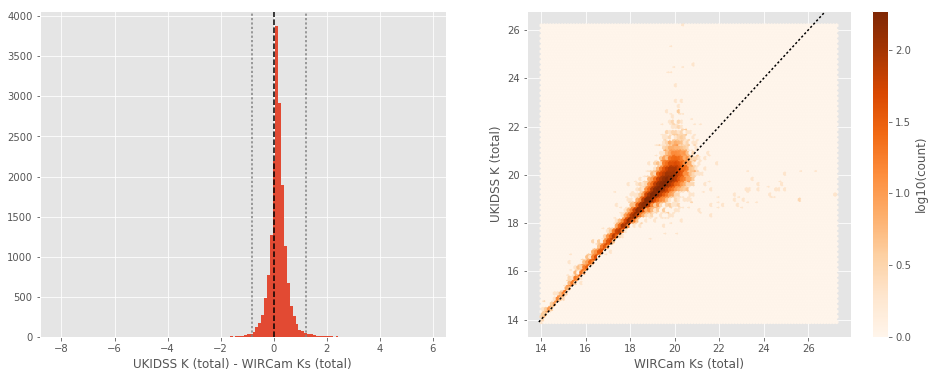

In [10]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [11]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [12]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_COSMOS.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: 0.08
- Median Absolute Deviation: 0.55
- 1% percentile: -1.735052299499512
- 99% percentile: 3.109880828857419


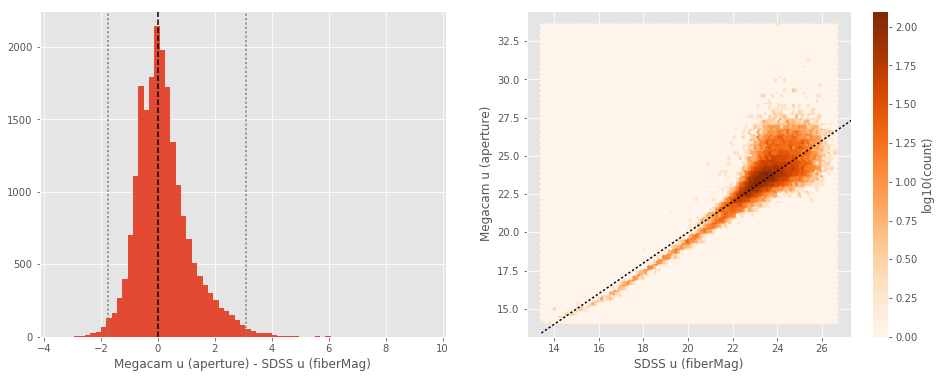

Megacam u (total) - SDSS u (petroMag):
- Median: -0.04
- Median Absolute Deviation: 0.84
- 1% percentile: -4.41092529296875
- 99% percentile: 3.967271518707274


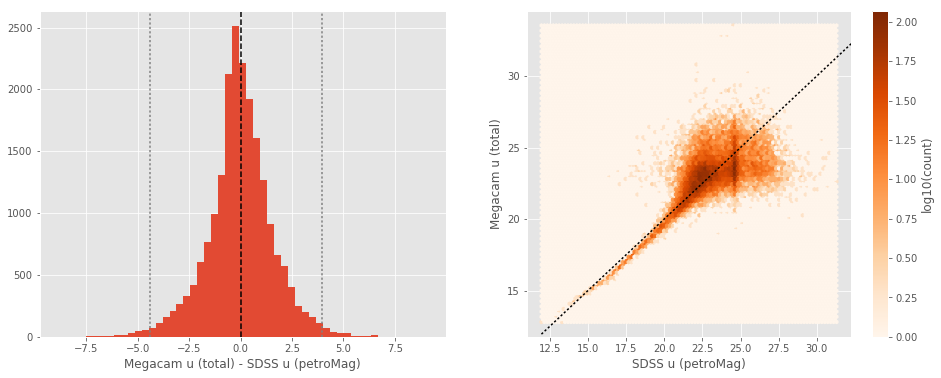

OMEGACam u (aperture) - SDSS u (fiberMag):
- Median: 0.11
- Median Absolute Deviation: 0.43
- 1% percentile: -1.596651840209961
- 99% percentile: 3.089199371337889


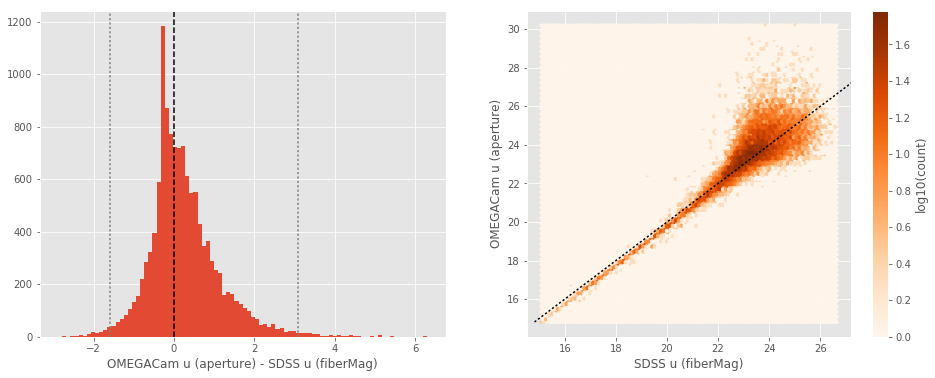

OMEGACam u (total) - SDSS u (petroMag):
- Median: 0.25
- Median Absolute Deviation: 0.77
- 1% percentile: -4.133014030456543
- 99% percentile: 4.614612464904785


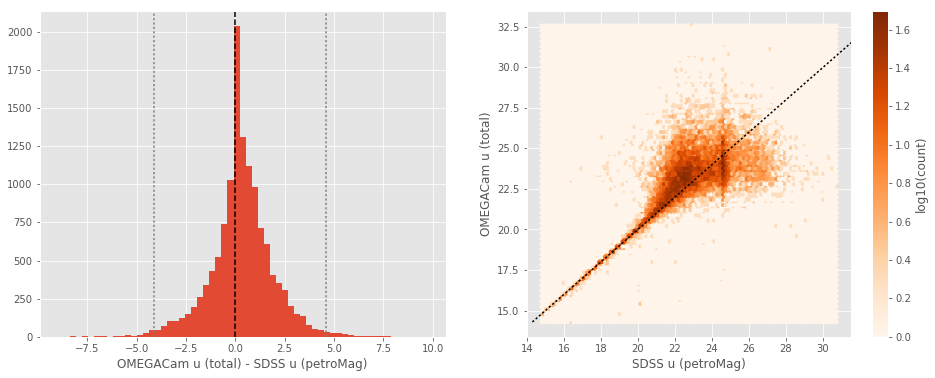

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.34
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1639002990722658
- 99% percentile: 0.6605275726318357


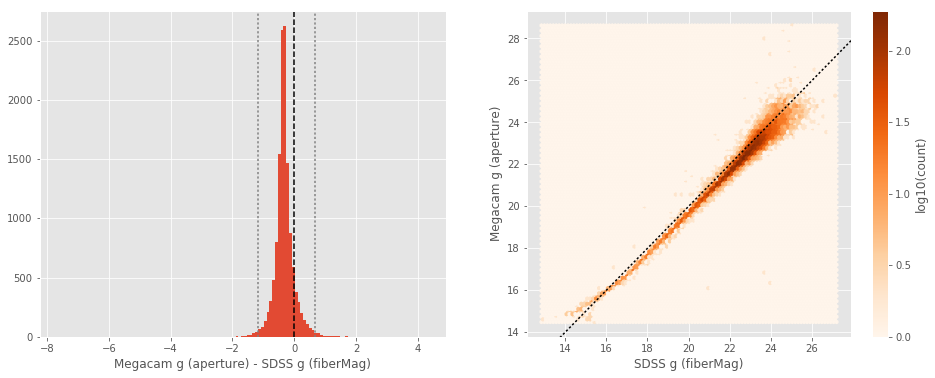

Megacam g (total) - SDSS g (petroMag):
- Median: -0.17
- Median Absolute Deviation: 0.23
- 1% percentile: -3.689757785797119
- 99% percentile: 1.435608062744142


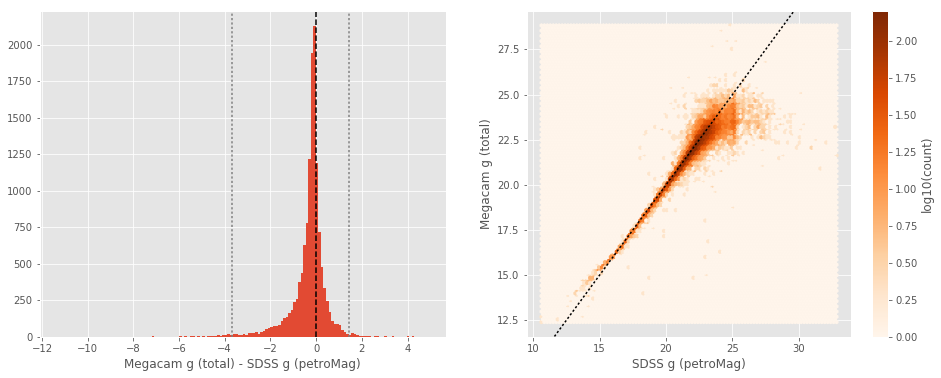

DECam g (aperture) - SDSS g (fiberMag):
- Median: -0.46
- Median Absolute Deviation: 0.15
- 1% percentile: -1.3317068481445313
- 99% percentile: 1.2690931510925285


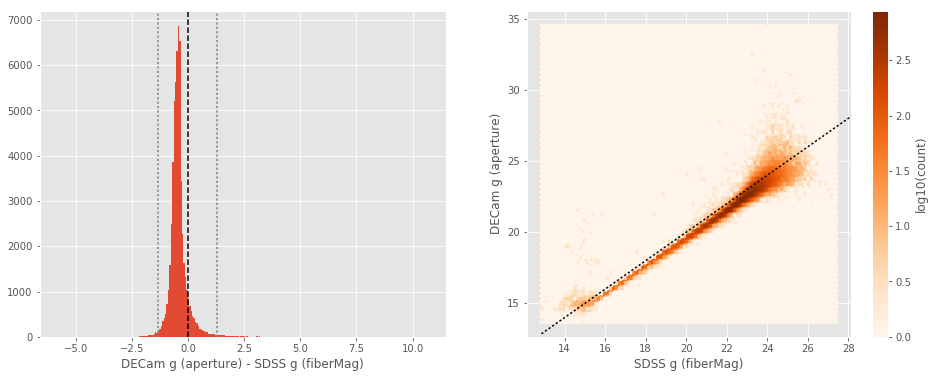

DECam g (total) - SDSS g (petroMag):
- Median: -0.11
- Median Absolute Deviation: 0.24
- 1% percentile: -3.6397795867919926
- 99% percentile: 1.8089286041259702


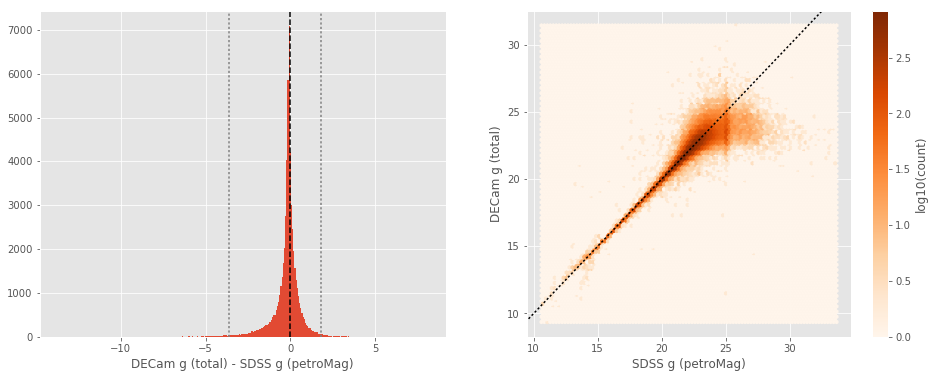

OMEGACam g (aperture) - SDSS g (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9429903411865235
- 99% percentile: 1.019370994567871


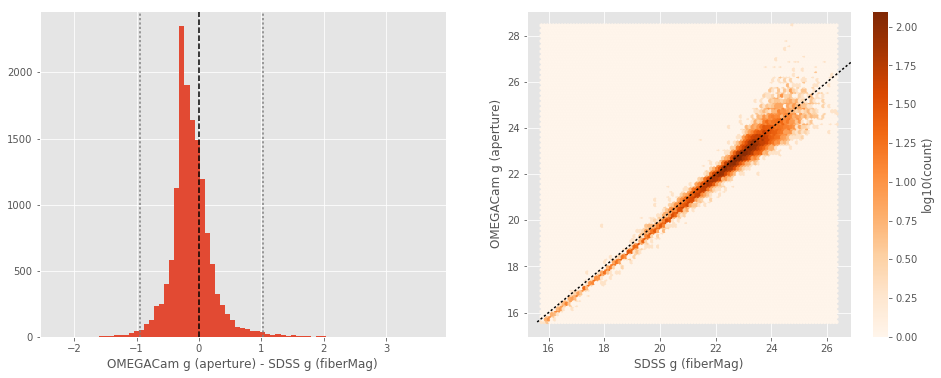

OMEGACam g (total) - SDSS g (petroMag):
- Median: 0.08
- Median Absolute Deviation: 0.24
- 1% percentile: -3.199727249145507
- 99% percentile: 2.094062232971188


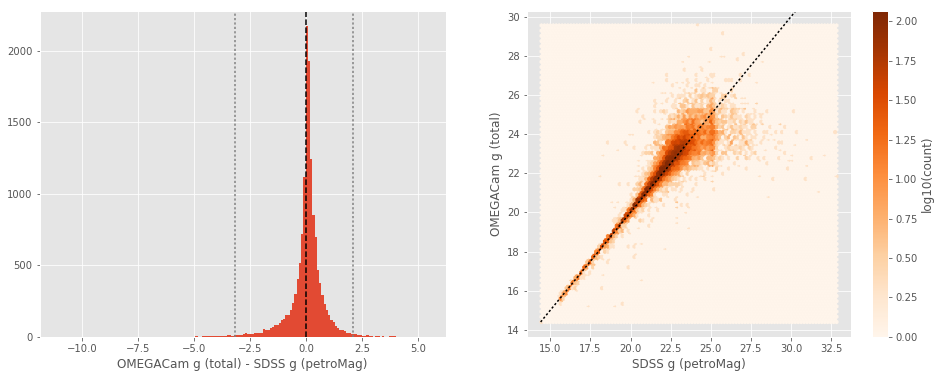

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.27
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1852587509155275
- 99% percentile: 4.643336791992211


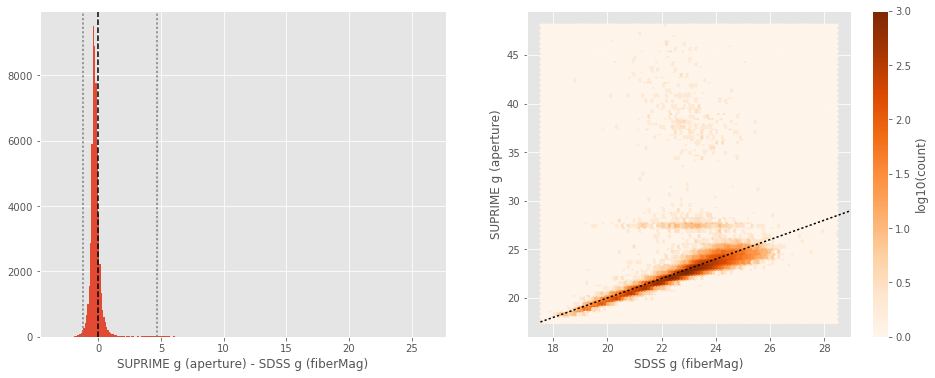

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.28
- 1% percentile: -3.7602262115478515
- 99% percentile: 4.321117134094239


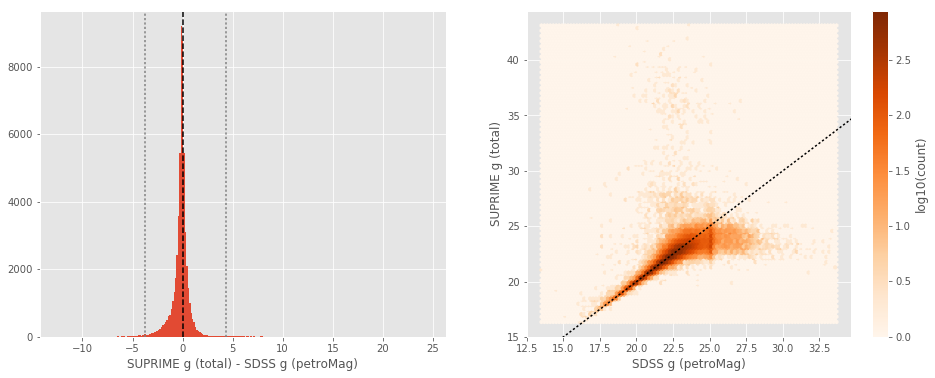

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.50
- Median Absolute Deviation: 0.27
- 1% percentile: -2.4781885528564453
- 99% percentile: 2.0431791305541993


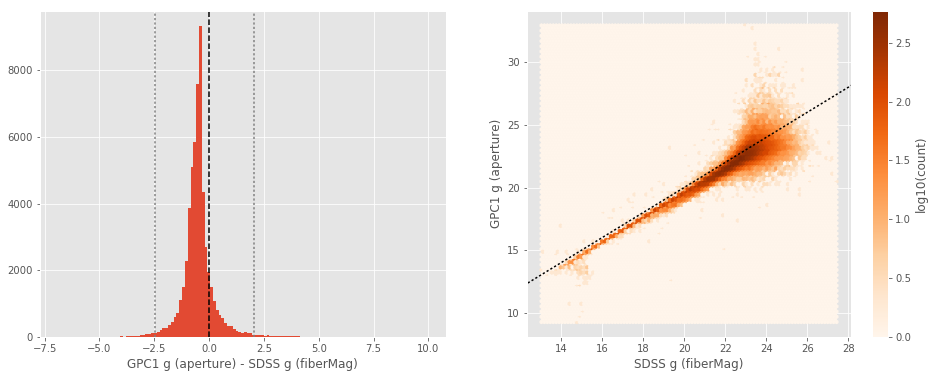

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.29
- 1% percentile: -4.374816207885742
- 99% percentile: 1.9304080581664997


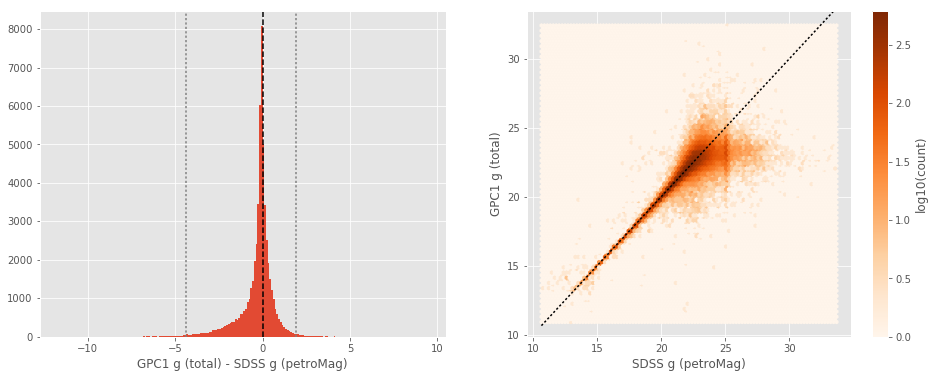

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9926081848144531
- 99% percentile: 0.43007174491882194


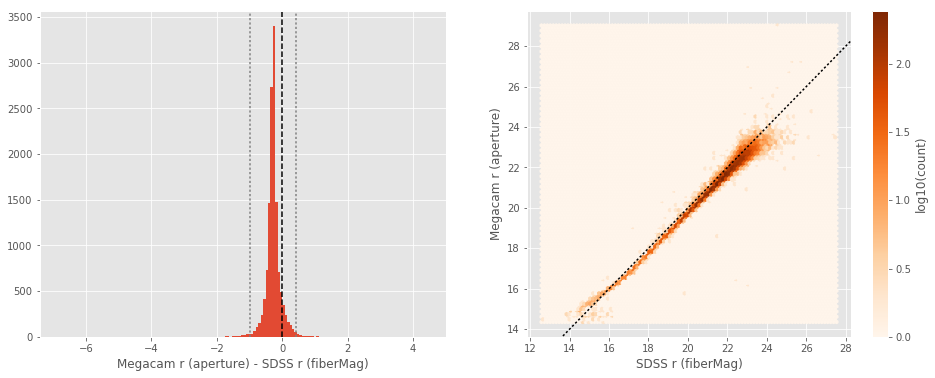

Megacam r (total) - SDSS r (petroMag):
- Median: -0.06
- Median Absolute Deviation: 0.15
- 1% percentile: -3.293231506347656
- 99% percentile: 1.050884590148922


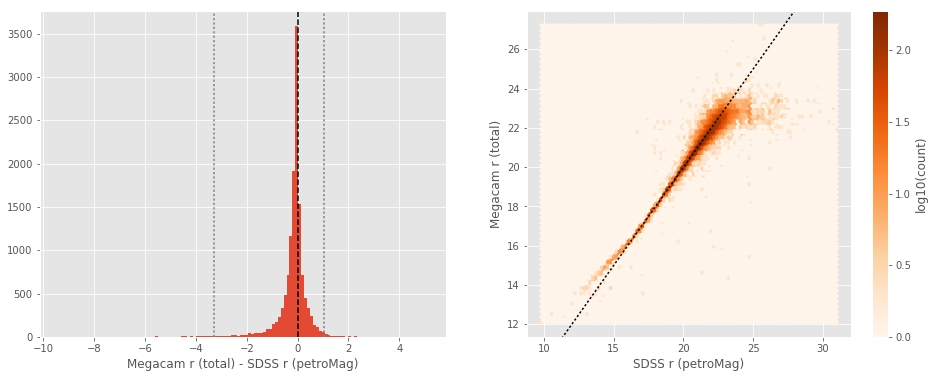

DECam r (aperture) - SDSS r (fiberMag):
- Median: -0.55
- Median Absolute Deviation: 0.12
- 1% percentile: -1.2170296859741212
- 99% percentile: 0.40372455596923895


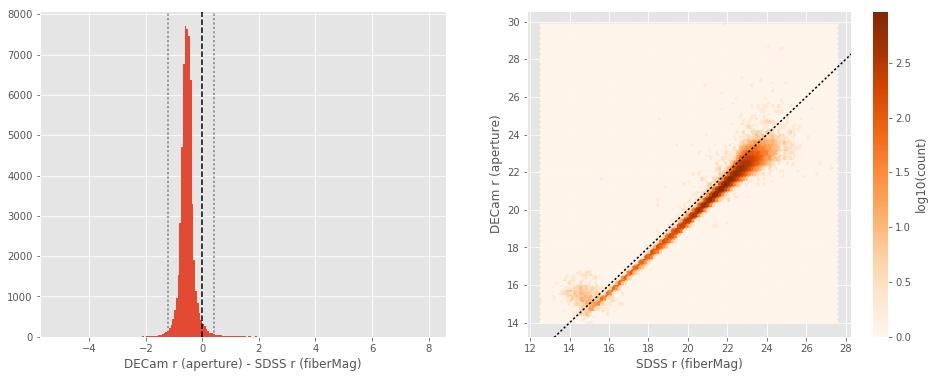

DECam r (total) - SDSS r (petroMag):
- Median: -0.16
- Median Absolute Deviation: 0.15
- 1% percentile: -3.148070240020752
- 99% percentile: 1.0046725273132298


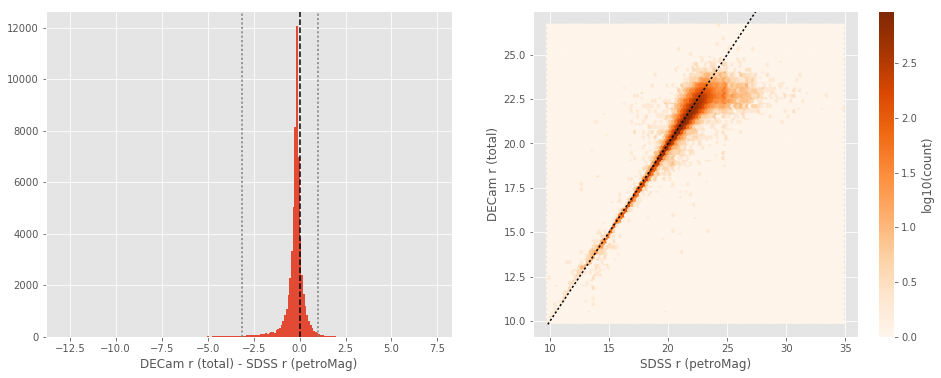

OMEGACam r (aperture) - SDSS r (fiberMag):
- Median: -0.26
- Median Absolute Deviation: 0.12
- 1% percentile: -0.964921817779541
- 99% percentile: 0.3830766105651858


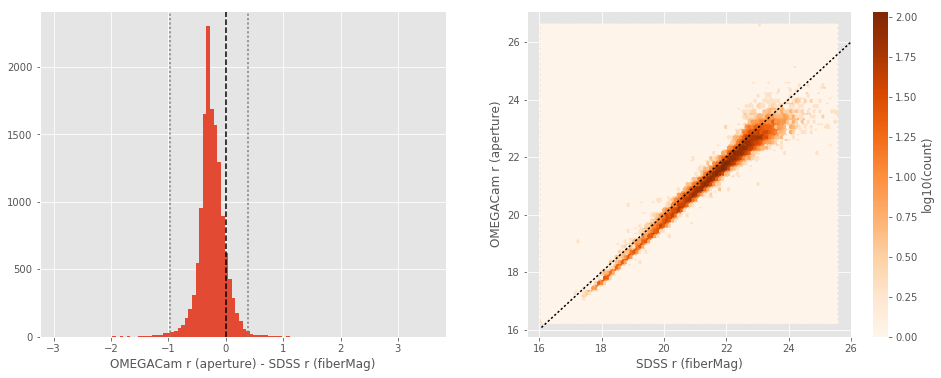

OMEGACam r (total) - SDSS r (petroMag):
- Median: -0.01
- Median Absolute Deviation: 0.15
- 1% percentile: -3.0445742225646972
- 99% percentile: 1.2092012405395518


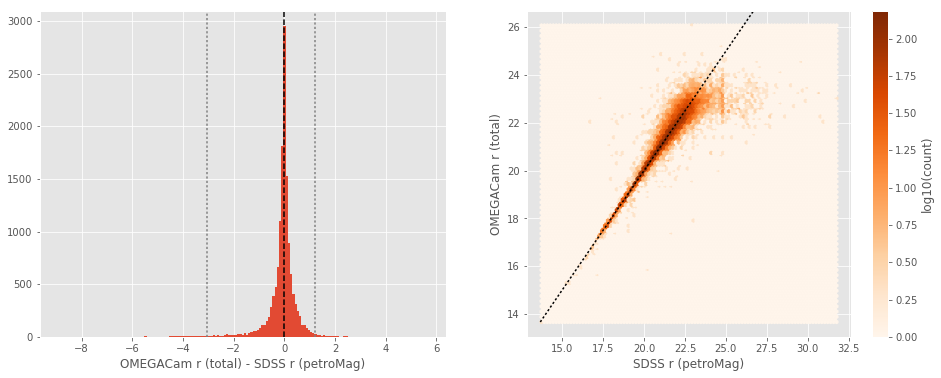

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.27
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9626075744628906
- 99% percentile: 19.201366863250726


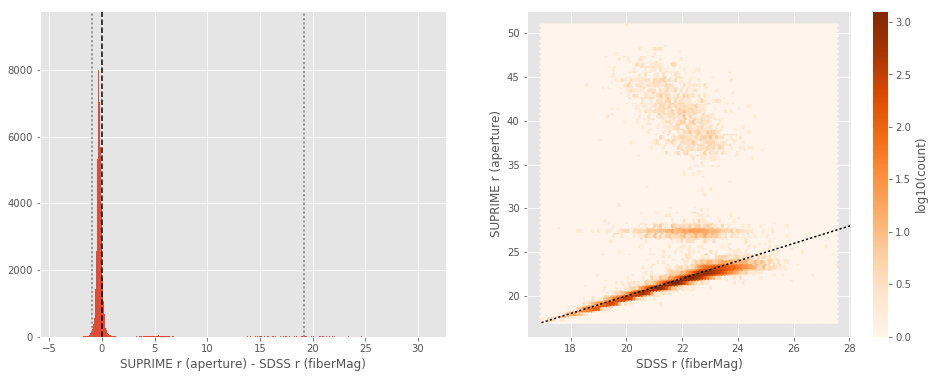

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.10
- Median Absolute Deviation: 0.18
- 1% percentile: -3.062121963500976
- 99% percentile: 14.236016082763706


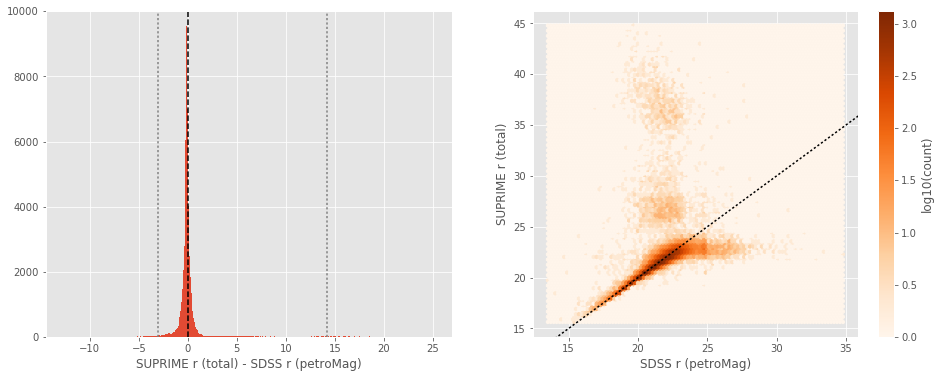

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.39
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4749344825744628
- 99% percentile: 1.0008537864685025


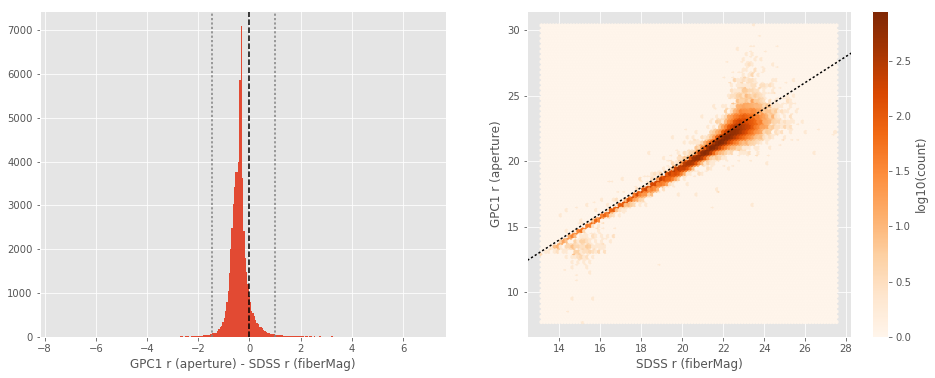

GPC1 r (total) - SDSS r (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -3.0951134681701657
- 99% percentile: 1.447239818572998


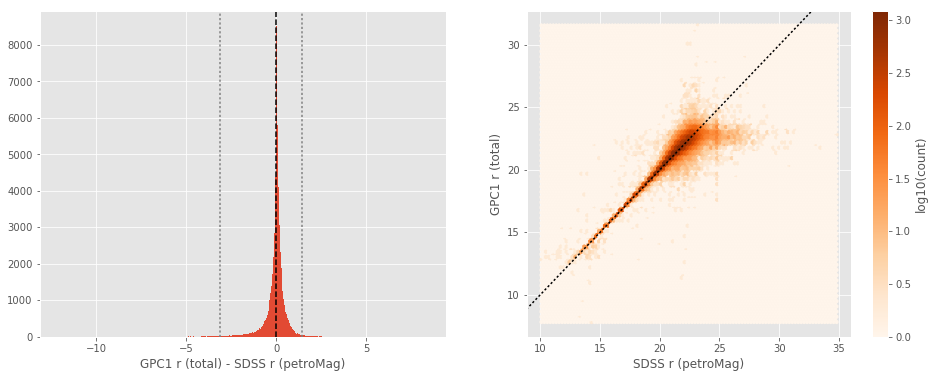

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9185096740722656
- 99% percentile: 0.5443773460388175


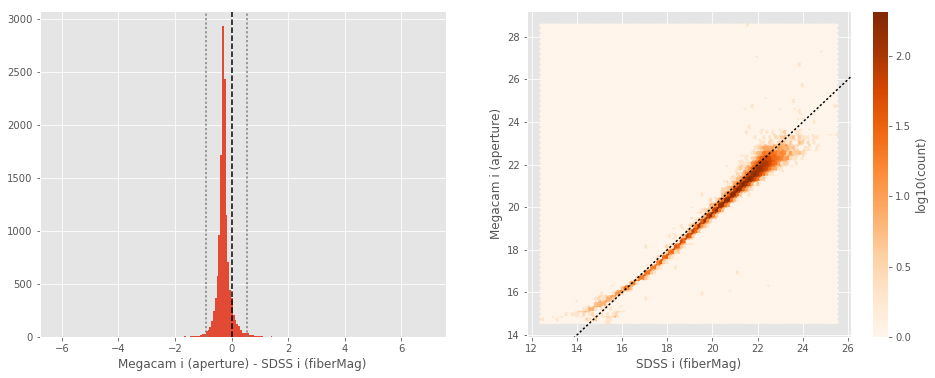

Megacam i (total) - SDSS i (petroMag):
- Median: -0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -3.665563678741455
- 99% percentile: 1.0795299530029276


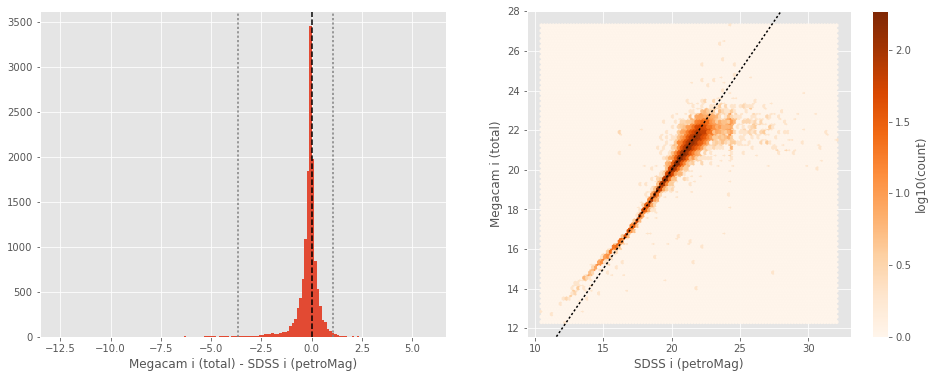

OMEGACam i (aperture) - SDSS i (fiberMag):
- Median: -0.24
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8830828857421875
- 99% percentile: 0.4808610534667966


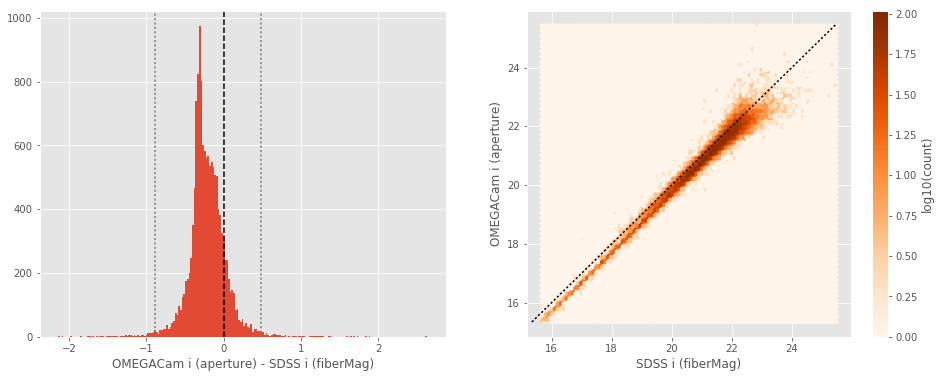

OMEGACam i (total) - SDSS i (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -3.254360580444336
- 99% percentile: 1.348939208984375


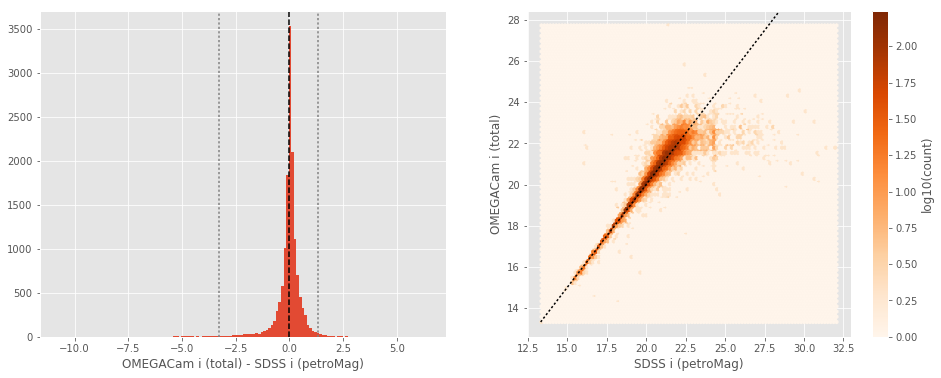

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9637155151367188
- 99% percentile: 0.5207080078125003


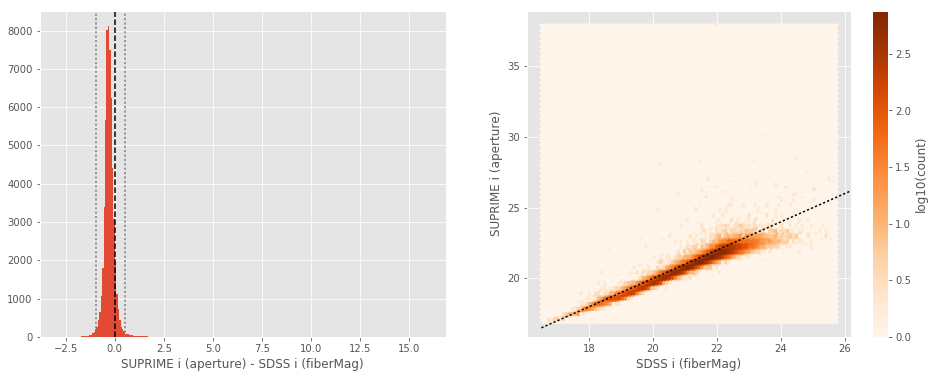

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.11
- Median Absolute Deviation: 0.19
- 1% percentile: -3.629803333282471
- 99% percentile: 1.141928634643548


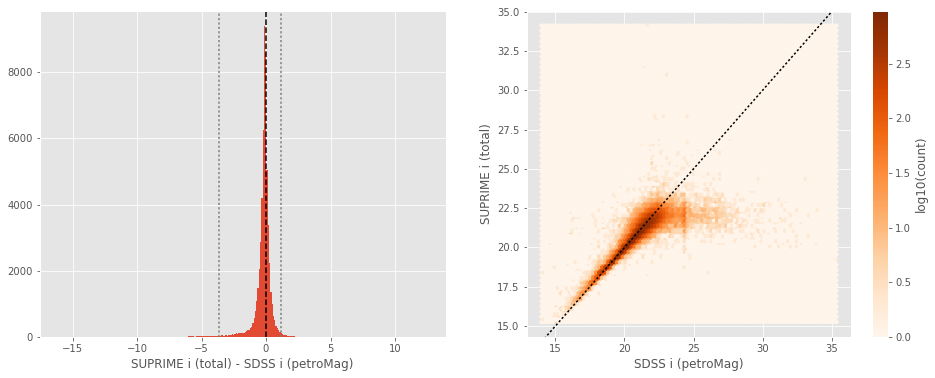

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.39
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1593441009521483
- 99% percentile: 0.5544780731201178


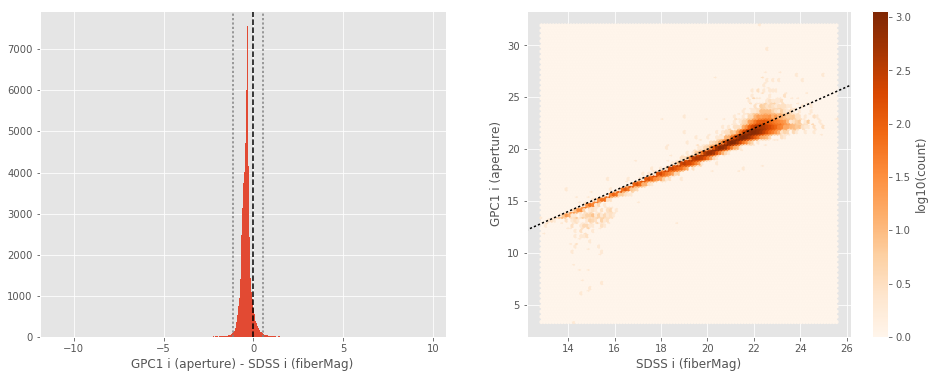

GPC1 i (total) - SDSS i (petroMag):
- Median: 0.05
- Median Absolute Deviation: 0.15
- 1% percentile: -3.2140436935424805
- 99% percentile: 1.1524100112915017


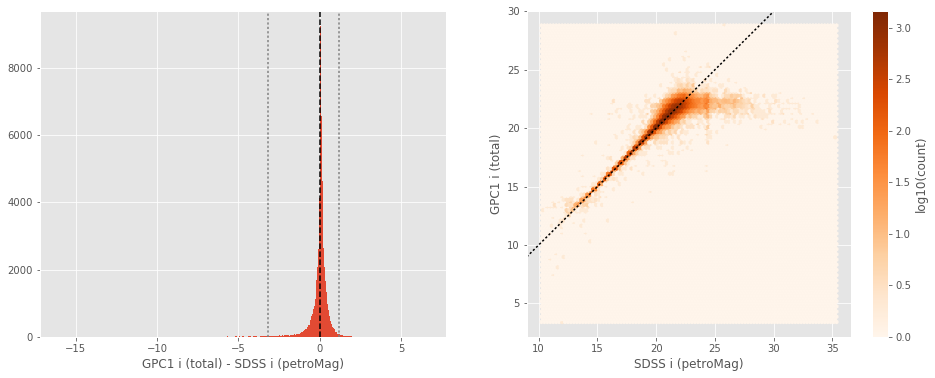

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.17
- Median Absolute Deviation: 0.17
- 1% percentile: -1.5258906173706055
- 99% percentile: 1.0076086425781254


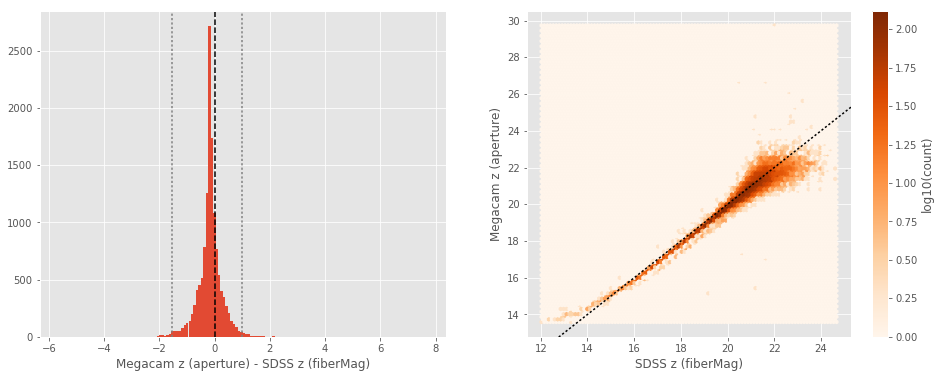

Megacam z (total) - SDSS z (petroMag):
- Median: 0.02
- Median Absolute Deviation: 0.38
- 1% percentile: -4.58455307006836
- 99% percentile: 1.844368133544923


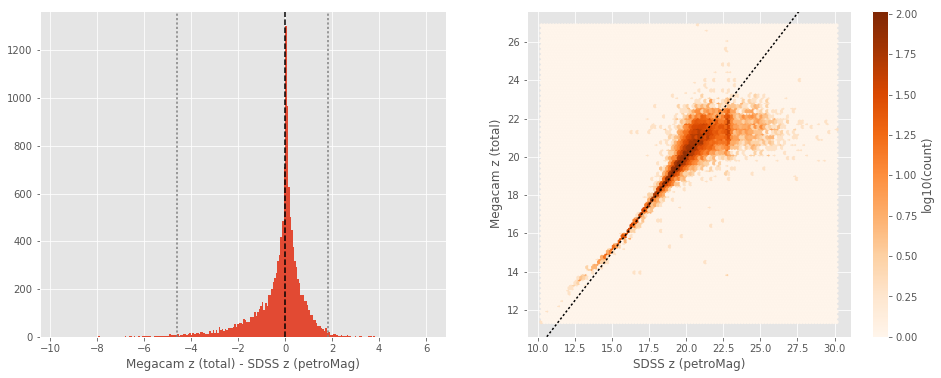

DECam z (aperture) - SDSS z (fiberMag):
- Median: -0.44
- Median Absolute Deviation: 0.18
- 1% percentile: -1.61138858795166
- 99% percentile: 1.0899633407592733


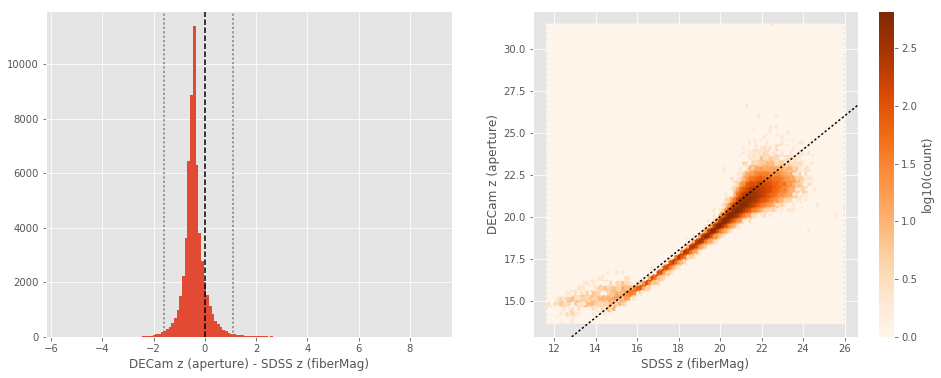

DECam z (total) - SDSS z (petroMag):
- Median: -0.12
- Median Absolute Deviation: 0.34
- 1% percentile: -4.40126142501831
- 99% percentile: 1.7904283905029283


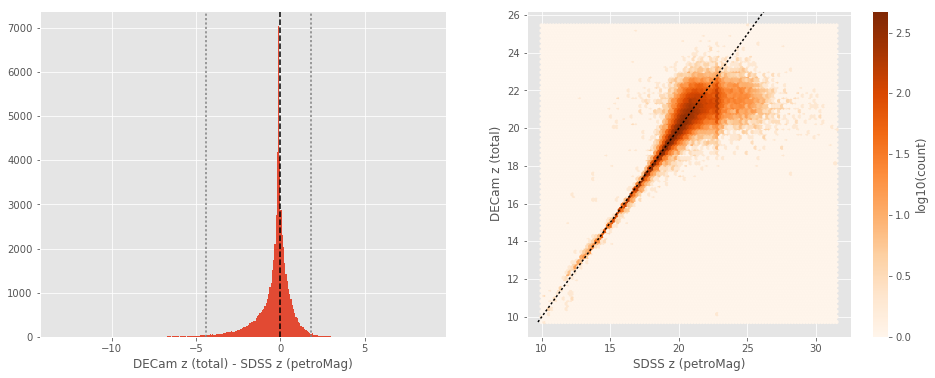

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.20
- Median Absolute Deviation: 0.20
- 1% percentile: -1.4548544883728027
- 99% percentile: 5.562977943420412


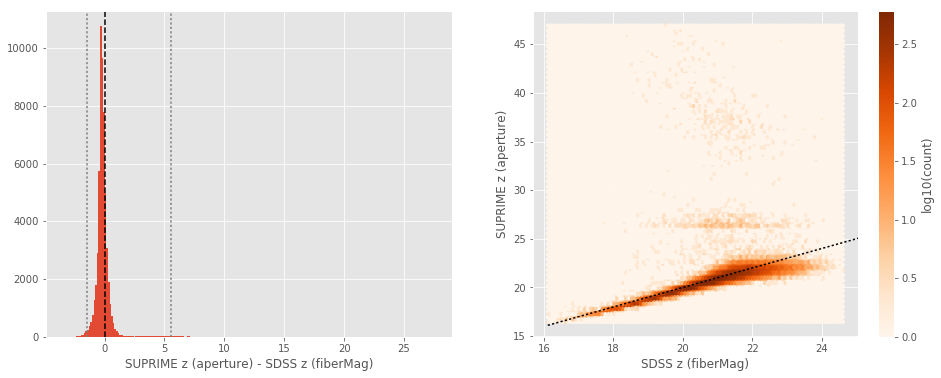

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.07
- Median Absolute Deviation: 0.40
- 1% percentile: -4.4408163070678714
- 99% percentile: 5.34305679321289


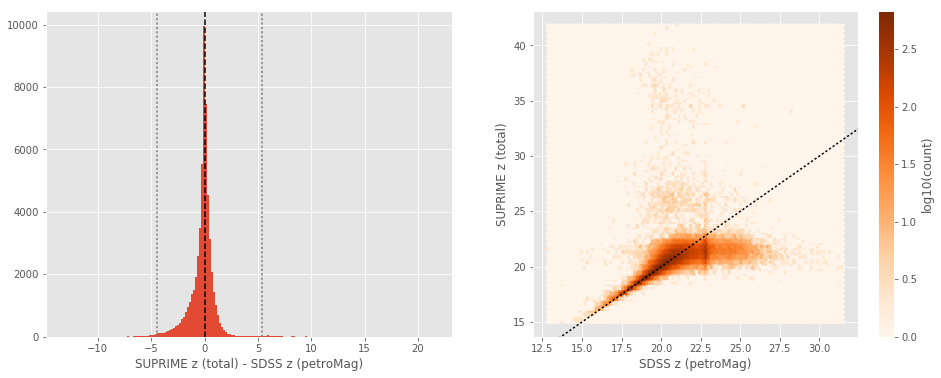

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6199073982238767
- 99% percentile: 1.2484591674804684


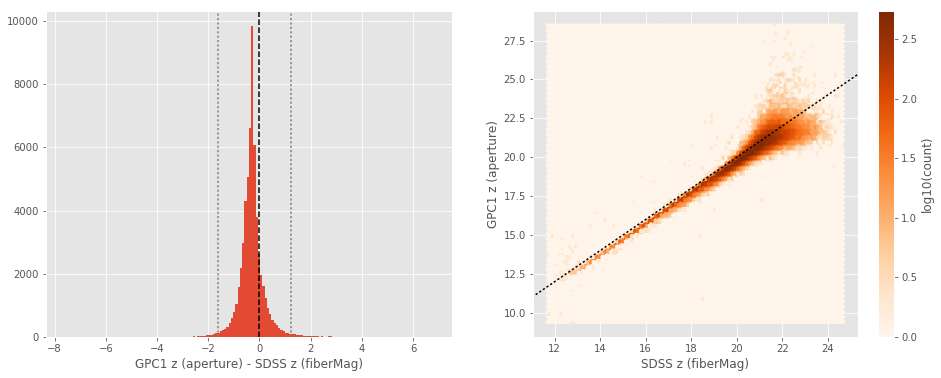

GPC1 z (total) - SDSS z (petroMag):
- Median: 0.10
- Median Absolute Deviation: 0.34
- 1% percentile: -4.248807601928711
- 99% percentile: 1.96720136642456


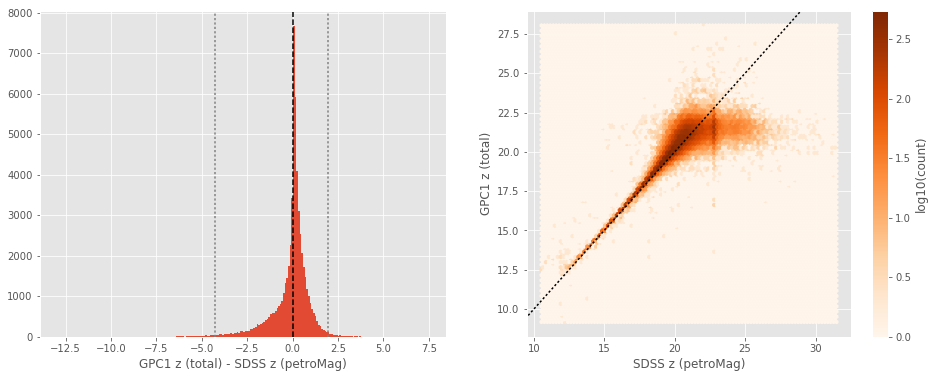

In [13]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1])]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1])]
        master_cat_mag_tot = master_catalogue["m_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_tot, master_cat_mag_tot,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [14]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [15]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_COSMOS.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.06
- Median Absolute Deviation: 0.05
- 1% percentile: -0.6913685057737169
- 99% percentile: 2.8818979037569252


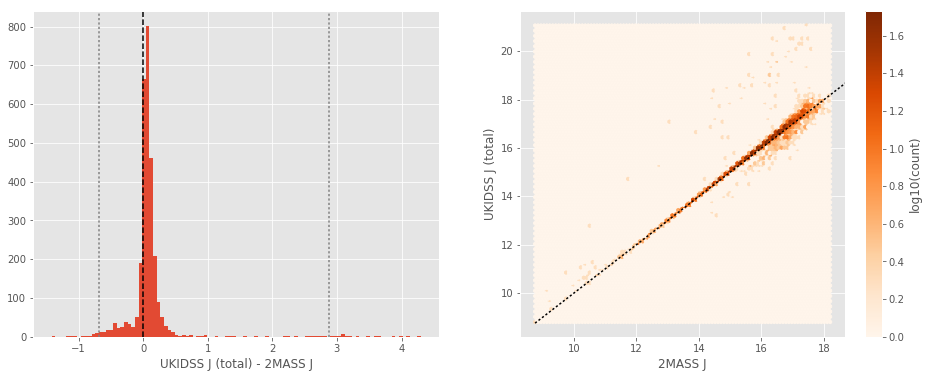

In [16]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.715159017549376
- 99% percentile: 0.929766507963318


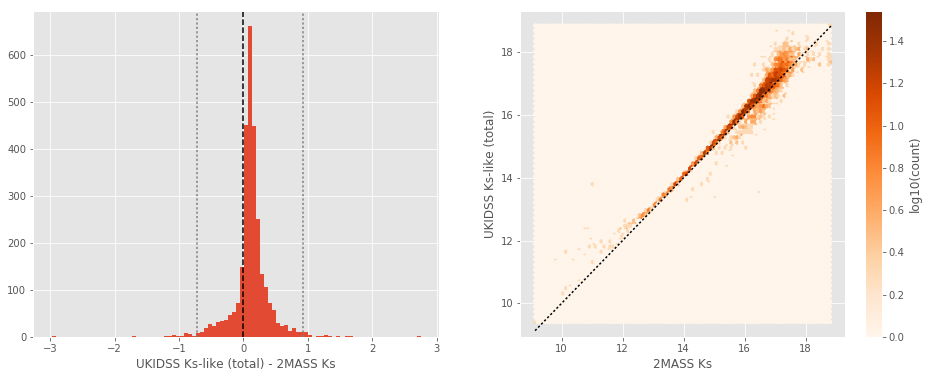

In [17]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

VISTA J (total) - 2MASS J:
- Median: -0.01
- Median Absolute Deviation: 0.05
- 1% percentile: -0.7406802874662239
- 99% percentile: 0.328832618417565


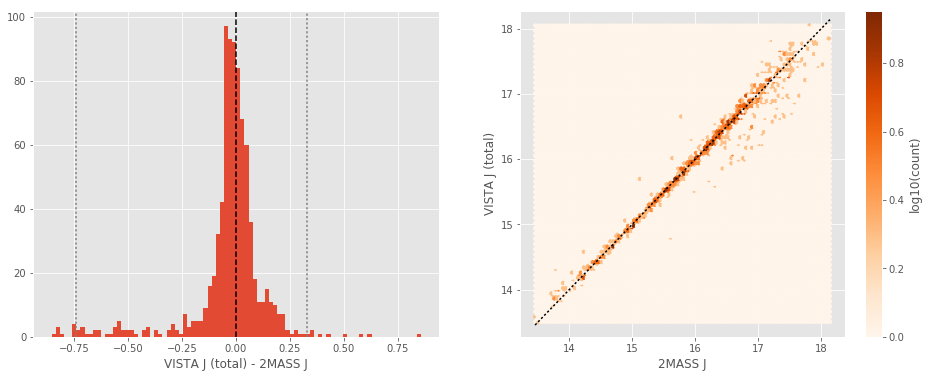

In [18]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_wircam_j'][ml_twomass_idx],
                labels=("2MASS J", "VISTA J (total)"))

VISTA Ks (total) - 2MASS Ks:
- Median: 0.00
- Median Absolute Deviation: 0.07
- 1% percentile: -1.0670893799456174
- 99% percentile: 0.6706602271405657


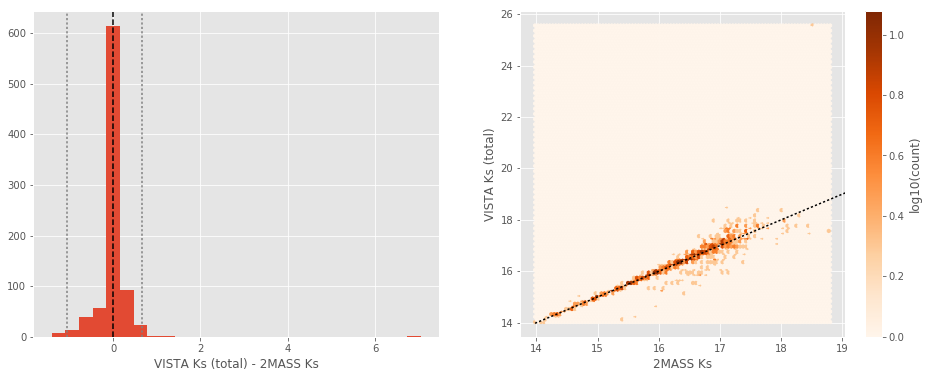

In [19]:
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, master_catalogue['m_wircam_ks'][ml_twomass_idx],
                labels=("2MASS Ks", "VISTA Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 546464 / 2599374 (21.02%)


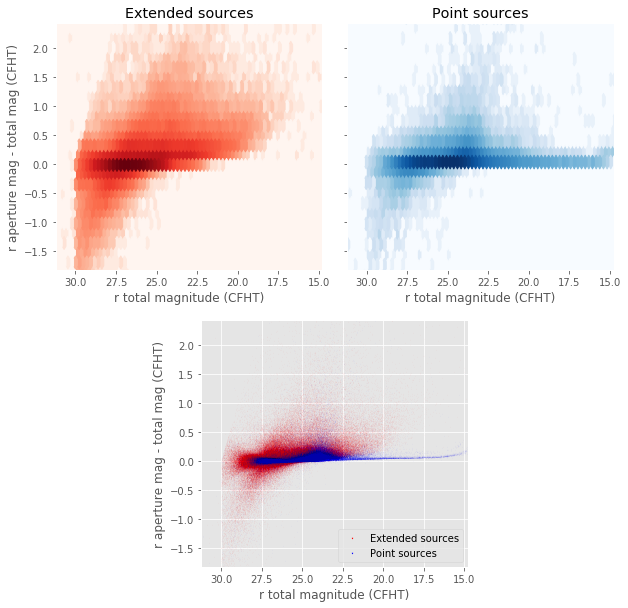

In [20]:
nb_ccplots(
    master_catalogue['m_megacam_r'],
    master_catalogue['m_ap_megacam_r'] - master_catalogue['m_megacam_r'],
    "r total magnitude (CFHT)", "r aperture mag - total mag (CFHT)",
    master_catalogue["stellarity"],
    invert_x=True
)

## V - Color-color and magnitude-color plots

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 24170 / 2599374 (0.93%)


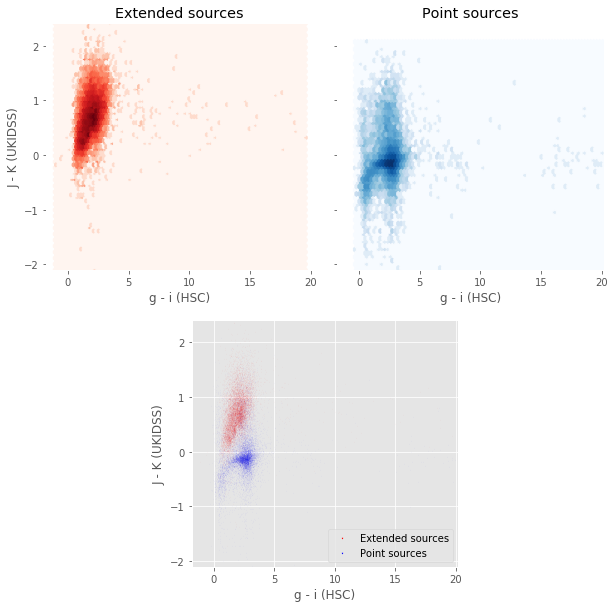

In [21]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (HSC)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 139279 / 2599374 (5.36%)


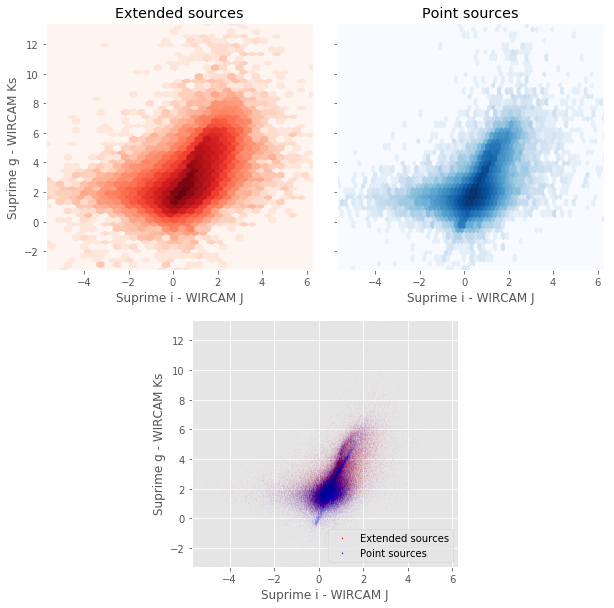

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_wircam_j'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_wircam_ks'],
    "Suprime i - WIRCAM J", "Suprime g - WIRCAM Ks",
    master_catalogue["stellarity"]
)

Number of source used: 471691 / 2599374 (18.15%)


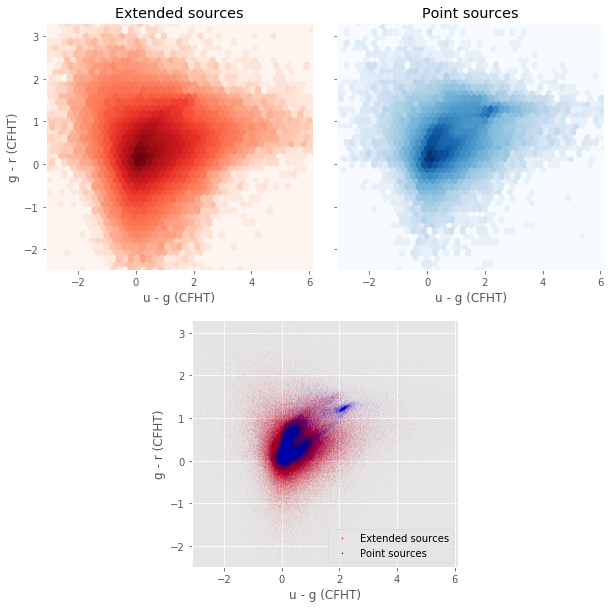

In [23]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 24172 / 2599374 (0.93%)


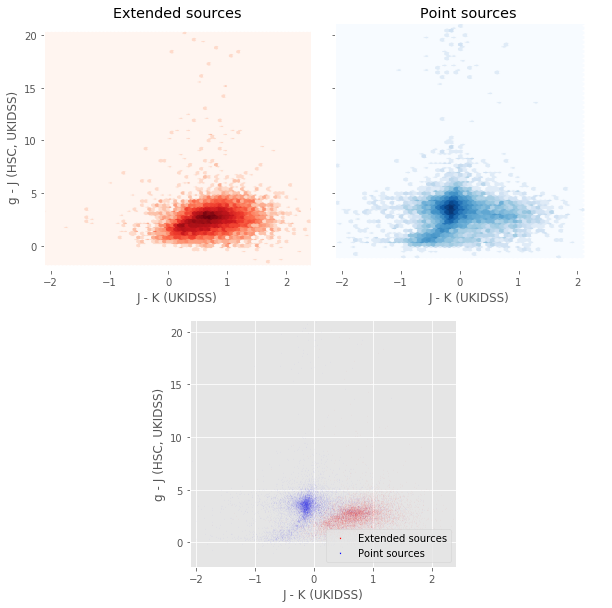

In [24]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 27728 / 2599374 (1.07%)


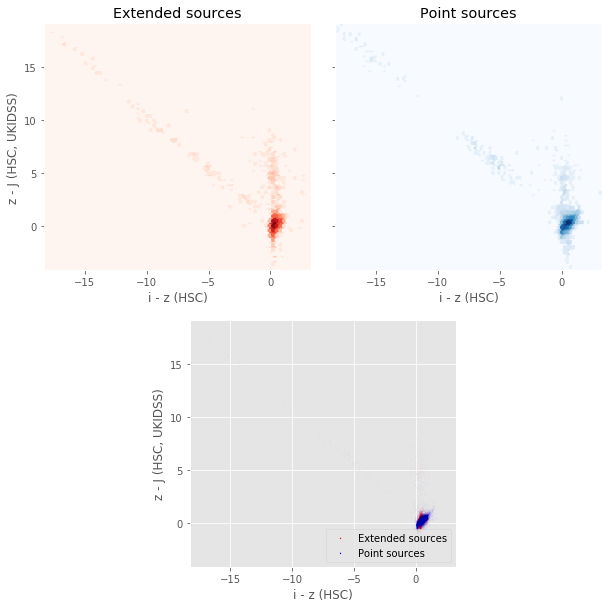

In [25]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (HSC)", "z - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)